# Analysing results of all models
This notebook analyses the results of the DeepConvNet and Microstate models on the EEG data.
It visualizes the test accuracies across different subjects and study types.
Compares the performance of the models and provides insights into their effectiveness.
And verifies statistical significance of the results.


In [2]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")

import pickle



# change directory go into Notebooks folder
if os.path.basename(os.getcwd()) != 'Notebooks':
    if os.path.basename(os.getcwd()) == 'lib':
        os.chdir(os.path.join(os.getcwd(), '..', 'Notebooks'))
    else:
        os.chdir(os.path.join(os.getcwd(), 'Notebooks'))
else:
    # if already in Notebooks folder, do nothing
    pass

from lib import my_functions as mf
from lib.my_models import MicroSNet, MultiModalClassifier
from lib import my_stats_functions as msf

✅ FIXED: Adaptive multimodal NOW INCLUDED in subject comparisons!
📊 Model comparisons: Adaptive uses fine-tuned scores
📊 Subject comparisons: Adaptive uses base scores for fair comparison
🎯 All three subject types compared for all models including Multimodal


## Loading all data

In [3]:
df_info = pd.read_csv('../Data/data_info.csv')
df_info.head()

,subject,n_trials,n_open,n_rest,n_close
0,0,400,100,200,100
1,1,340,85,170,85
2,2,340,85,170,85
3,3,340,85,170,85
4,4,380,95,190,95


In [4]:
data_path = '../Data/'
output_path = '../Output/ica_rest_all/'
do_all = False
n_subjects = 50
subject_list = list(range(n_subjects))
all_data, all_y = mf.load_all_data(subjects_list=None, do_all=do_all)


## Comparing all type of studies

In [57]:
subject_types = ['', 'independent_',, 'adaptive_'']
# subject_types = ['', 'dependent_harmonize_']

# Save the multimodal results
output_path = '../Output/ica_rest_all/'
ms_timeseries_path = os.path.join(output_path, 'ms_timeseries_harmonize.pkl')
with open(ms_timeseries_path, 'rb') as f:
    finals_ls = pickle.load(f)
results = {}
for subject_type in subject_types:
    print(f"Loading results for {subject_type}subjects...")
    if subject_type == '':
        output_path = '../Output/ica_rest_all/'
    else:
        # subject_type = subject_type.replace('_', '')
        folder_name = subject_type[:-1] if subject_type.endswith('_') else subject_type
        output_path = f'../Output/ica_rest_all/{folder_name}/'
    results_raw = np.load(os.path.join(output_path, f'{subject_type}results_ica_rest_all.npy'), allow_pickle=True).item()
    results_combine = np.load(os.path.join(output_path, f'{subject_type}multimodal_results_ica_rest_all.npy'), allow_pickle=True).item()
    try:
        results_ms = np.load(os.path.join(output_path, f'{subject_type}ms_results_ica_rest_all.npy'), allow_pickle=True).item()
    except FileNotFoundError:
        print(f"No microstate results found for {subject_type}subjects, loading from _results_ica_rest_all.npy")
    try:
        results_ms = np.load(os.path.join(output_path, f'{subject_type}ms_microsnet_results_ica_rest_all.npy'), allow_pickle=True).item()
    except FileNotFoundError:
        print(f"No microstate results found for {subject_type}subjects, loading from microsnet_results_ica_rest_all.pkl")
        # results_ms = np.load(os.path.join(output_path, f'{subject_type}microsnet_results_ica_rest_all.npy'), allow_pickle=True).item()
    # if subject_type contains 'clean'
    if 'adaptive' in subject_type:
        accuracy_list = results_combine['summary']['finetuned_test_accuracies']
    else:
        accuracy_list = [res['test_accuracy'] for res in results_combine['subject_results']]
    if subject_type == '':
        subject_type = 'dependent_'
    subject_type = subject_type[:-1] if subject_type.endswith('_') else subject_type
    results[f'subject_{subject_type}'] = {
            'DeepConvNet' : results_raw['test_accuracies'],
            'microstate': results_ms['test_accuracies'],
            'multimodal': accuracy_list
        }
    
    output_path = '../Output/ica_rest_all/results_all/plots/'
    if not os.path.exists(output_path):
        os.makedirs(output_path)

SyntaxError: unterminated string literal (detected at line 1) (4284709600.py, line 1)

In [64]:
# subject_types = ['dependent_', 'independent_', 'adaptive_']
subject_types = ['dependent_', 'dependent_harmonize_']

# Define the different model types to try
model_types = ['', 'microsnet_', 'multiscale_microsnet_', 'embedded_microsnet_']  # Add more as needed

# Save the multimodal results
output_path = '../Output/ica_rest_all/'
ms_timeseries_path = os.path.join(output_path, 'ms_timeseries_harmonize.pkl')
with open(ms_timeseries_path, 'rb') as f:
    finals_ls = pickle.load(f)

results = {}

for subject_type in subject_types:
    print(f"Loading results for {subject_type}subjects...")
    
    if subject_type == '':
        output_path = '../Output/ica_rest_all/'
    else:
        folder_name = subject_type[:-1] if subject_type.endswith('_') else subject_type
        output_path = f'../Output/ica_rest_all/{folder_name}/'
    
    # Load raw results (these remain the same)
    results_raw = np.load(os.path.join(output_path, f'{subject_type}results_ica_rest_all.npy'), allow_pickle=True).item()
    
    # Clean up subject_type for results key
    display_subject_type = subject_type
    if subject_type == '':
        display_subject_type = 'dependent_'
    display_subject_type = display_subject_type[:-1] if display_subject_type.endswith('_') else display_subject_type
    
    # Initialize results for this subject type
    results[f'{display_subject_type}'] = {
        'DeepConvNet': results_raw['test_accuracies']
    }
    
    # Try each model type
    for model_type in model_types:
        print(f"  Trying model type: '{model_type}'...")
        
        # Construct file names
        if model_type == '':
            ms_file = f'{subject_type}ms_results_ica_rest_all.npy'
            multimodal_file = f'{subject_type}multimodal_results_ica_rest_all.npy'
            model_name = 'microsnet'  # default name for empty model_type
        else:
            # Remove trailing underscore for file names but keep for model_name
            model_prefix = model_type.rstrip('_')
            ms_file = f'{subject_type}ms_{model_prefix}_results_ica_rest_all.npy'
            multimodal_file = f'{subject_type}multimodal_{model_prefix}_results_ica_rest_all.npy'
            model_name = model_prefix
        
        ms_path = os.path.join(output_path, ms_file)
        multimodal_path = os.path.join(output_path, multimodal_file)
        
        # Try to load both ms and multimodal files for this model type
        ms_results = None
        multimodal_results = None
        
        try:
            ms_results = np.load(ms_path, allow_pickle=True).item()
            print(f"    Found MS file: {ms_file}")
        except FileNotFoundError:
            print(f"    MS file not found: {ms_file}")
        
        try:
            multimodal_results = np.load(multimodal_path, allow_pickle=True).item()
            print(f"    Found multimodal file: {multimodal_file}")
        except FileNotFoundError:
            print(f"    Multimodal file not found: {multimodal_file}")
        
        # If we found the files, add them to results
        if ms_results is not None:
            results[f'{display_subject_type}'][model_name] = ms_results['test_accuracies']
        
        if multimodal_results is not None:
            # Process accuracy list based on subject type
            if 'adaptive' in subject_type:
                accuracy_list = multimodal_results['summary']['finetuned_test_accuracies']
            else:
                accuracy_list = [res['test_accuracy'] for res in multimodal_results['subject_results']]
            
            # Create multimodal key name
            multimodal_key = f'multimodal_{model_name}' if model_name != 'microstate' else 'multimodal'
            results[f'{display_subject_type}'][multimodal_key] = accuracy_list

    print(f"  Loaded models for {subject_type}subjects: {list(results[f'{display_subject_type}'].keys())}")

# Print summary of what was loaded
print("\nSummary of loaded data:")
for subject_key, subject_data in results.items():
    print(f"{subject_key}: {list(subject_data.keys())}")

# Create output directory for plots
output_path = '../Output/ica_rest_all/results_all/plots/'
if not os.path.exists(output_path):
    os.makedirs(output_path)

Loading results for dependent_subjects...
  Trying model type: ''...
    Found MS file: dependent_ms_results_ica_rest_all.npy
    Found multimodal file: dependent_multimodal_results_ica_rest_all.npy
  Trying model type: 'microsnet_'...
    MS file not found: dependent_ms_microsnet_results_ica_rest_all.npy
    Multimodal file not found: dependent_multimodal_microsnet_results_ica_rest_all.npy
  Trying model type: 'multiscale_microsnet_'...
    MS file not found: dependent_ms_multiscale_microsnet_results_ica_rest_all.npy
    Multimodal file not found: dependent_multimodal_multiscale_microsnet_results_ica_rest_all.npy
  Trying model type: 'embedded_microsnet_'...
    MS file not found: dependent_ms_embedded_microsnet_results_ica_rest_all.npy
    Multimodal file not found: dependent_multimodal_embedded_microsnet_results_ica_rest_all.npy
  Loaded models for dependent_subjects: ['DeepConvNet', 'microsnet', 'multimodal_microsnet']
Loading results for dependent_harmonize_subjects...
  Trying mo

In [65]:
def create_dynamic_palette_mapping(results):
    """Create color mapping using the 3 specific palettes sized by number of models per subject"""
    
    # Define which palette each subject type should use
    subject_palette_assignment = {
        'dependent': 'green',
        'dependent_harmonize': 'blue',
        'independent': 'green', 
        'independent_clean': 'green',
        'adaptive': 'orange',
        'adaptive_clean': 'orange',
    }
    
    color_mapping = {}
    
    for subject_key, subject_data in results.items():
        # Get number of models for this subject
        n_models = len(subject_data)
        
        # Determine which palette to use
        if subject_key in subject_palette_assignment:
            palette_type = subject_palette_assignment[subject_key]
        else:
            # Fallback: cycle through the 3 palettes for unknown subject types
            hash_val = hash(subject_key) % 3
            palette_types = ['blue', 'green', 'orange']
            palette_type = palette_types[hash_val]
        
        # Generate the appropriate palette with n_models colors
        if palette_type == 'blue':
            n_colors = n_models
            palette = sns.color_palette(palette='Blues_d', n_colors=n_colors)
        elif palette_type == 'green':
            n_colors = n_models
            palette = sns.color_palette(palette='summer_r', n_colors=n_colors)
        elif palette_type == 'orange':
            n_colors = n_models
            palette = sns.color_palette(palette='flare_r', n_colors=n_colors)
        
        # Map each model type to a color from the palette
        model_types = sorted(subject_data.keys())  # Sort for consistency
        for i, model_type in enumerate(model_types):
            color_mapping[f"{subject_key}_{model_type}"] = palette[i]
    
    return color_mapping

# Create the dynamic color mapping
color_mapping = create_dynamic_palette_mapping(results)


In [ ]:
# n_colors = len(subject_types) + 1
# palette_blue = sns.color_palette(palette='Blues_d', n_colors= n_colors)[:-1]
# palette_green = sns.color_palette(palette='summer_r', n_colors=n_colors)[:-1]
# palette_orange = sns.color_palette(palette='flare_r', n_colors=n_colors)[1:]

# # color_subject_type = ['independent_subject', 'independent_clean_subject', 'dependent_subject', 'adaptive_subject', 'adaptive_clean_subject']
# color_subject_type = ['subject_independent', 'subject_independent_clean', 'subject_dependent', 'subject_adaptive', 'subject_adaptive_clean']
# color_subject_type = ['subject_dependent', 'subject_dependent_harmonize']
# results_types = ['DeepConvNet', 'microstate', 'multimodal']
# colors = {}
# for result_type in results_types:
#     colors[result_type] = {}
#     for i, subject_type in enumerate(color_subject_type):
#         if result_type == 'DeepConvNet':
#             colors[result_type][subject_type] = palette_blue[i]
#         elif result_type == 'microstate':
#             colors[result_type][subject_type] = palette_green[i]
#         elif result_type == 'multimodal':
#             colors[result_type][subject_type] = palette_orange[i]
# # colors = {
# #     'raw': {
# #         'independent_subject': palette[,  
# #         'independent_clean_subject': palette[7],
# #         'subject': palette[5],  
# #     },
# #     'microstate': {
# #         'independent_subject': palette[2], 
# #         'independent_clean_subject': palette[6],
# #         'subject': palette[3],
# #     },
# #     'multimodal': {
# #         'independent_subject': palette[0], 
# #         'independent_clean_subject': palette[9],
# #         'subject': palette[1], 
# #     }
# # }

# line_types = ['--', '-', '--']

Creating first row plots (by model type)...
Creating second row plots (by study type)...


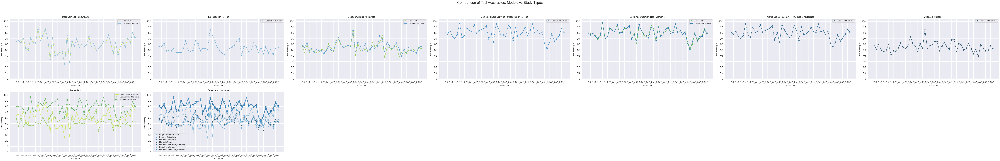


Plotting Summary:
First Row (by model type):
  Plot 1: DeepConvNet - 2 study types
  Plot 2: embedded_microsnet - 1 study types
  Plot 3: microsnet - 2 study types
  Plot 4: multimodal_embedded_microsnet - 1 study types
  Plot 5: multimodal_microsnet - 2 study types
  Plot 6: multimodal_multiscale_microsnet - 1 study types
  Plot 7: multiscale_microsnet - 1 study types

Remaining Rows (by study type):
  Plot 8: dependent - 3 models
  Plot 9: dependent_harmonize - 7 models

Total plots created: 7 model plots + 2 study type plots
Grid size: 2 rows × 7 columns


In [66]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os

def create_dynamic_palette_mapping(results):
    """Create color mapping using the 3 specific palettes sized by number of models per subject"""
    
    # Define which palette each subject type should use
    subject_palette_assignment = {
        'dependent': 'green',
        'dependent_harmonize': 'blue',
        'independent': 'green', 
        'independent_clean': 'green',
        'adaptive': 'orange',
        'adaptive_clean': 'orange',
    }
    
    color_mapping = {}
    
    for subject_key, subject_data in results.items():
        # Get number of models for this subject
        n_models = len(subject_data)
        
        # Determine which palette to use
        if subject_key in subject_palette_assignment:
            palette_type = subject_palette_assignment[subject_key]
        else:
            # Fallback: cycle through the 3 palettes for unknown subject types
            hash_val = hash(subject_key) % 3
            palette_types = ['blue', 'green', 'orange']
            palette_type = palette_types[hash_val]
        
        # Generate the appropriate palette with n_models colors
        if palette_type == 'blue':
            n_colors = n_models + 1
            palette = sns.color_palette(palette='Blues_d', n_colors=n_colors)[:-1]
        elif palette_type == 'green':
            n_colors = n_models + 1
            palette = sns.color_palette(palette='summer_r', n_colors=n_colors)[:-1]
        elif palette_type == 'orange':
            n_colors = n_models + 1
            palette = sns.color_palette(palette='flare_r', n_colors=n_colors)[1:]
        
        # Map each model type to a color from the palette
        model_types = sorted(subject_data.keys())  # Sort for consistency
        for i, model_type in enumerate(model_types):
            color_mapping[f"{subject_key}_{model_type}"] = palette[i]
    
    return color_mapping

# Create the dynamic color mapping
color_mapping = create_dynamic_palette_mapping(results)

# Define line types for different subjects
line_types = ['-', '--', '-.', ':', '-', '--']

# Get all unique model types and study types
all_model_types = set()
for subject_data in results.values():
    all_model_types.update(subject_data.keys())
all_model_types = sorted(list(all_model_types))

all_study_types = sorted(list(results.keys()))

# Calculate dynamic grid size
n_model_types = len(all_model_types)
n_study_types = len(all_study_types)
n_cols = max(n_model_types, n_study_types)  # Columns based on max of models or study types
n_rows = 2  # Fixed 2 rows

# Set up plotting parameters
font_size = 11
sns.set_theme(context="talk", style="darkgrid")
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12*n_cols, 7*n_rows))

# Handle case where we only have 1 row or 1 column
if n_rows == 1:
    axes = axes.reshape(1, -1)
elif n_cols == 1:
    axes = axes.reshape(-1, 1)

axs = axes.flatten()

# First row: Plot by model type (showing all study types per model)
print("Creating first row plots (by model type)...")
for ax_idx, model_type in enumerate(all_model_types):
    if ax_idx >= len(axs):
        break
        
    ax = axs[ax_idx]
    
    # Create readable title
    if model_type == 'DeepConvNet':
        title = 'DeepConvNet on Raw EEG'
    elif model_type == 'microsnet' or model_type == 'microstate':
        title = 'DeepConvNet on Microstate'  
    elif model_type.startswith('multimodal'):
        if model_type == 'multimodal':
            title = 'Combined DeepConvNet and Microstate'
        else:
            # For multimodal variants like multimodal_microsnet
            variant = model_type.replace('multimodal_', '')
            variant = variant.replace('microsnet', 'MicrosNet')
            variant = variant.replace('multiscale_microsnet', 'Multiscale MicrosNet')
            variant = variant.replace('embedded_microsnet', 'Embedded MicrosNet')
            title = f'Combined DeepConvNet - {variant}'
    elif model_type.startswith('embedded_microsnet'):
        title = 'Embedded MicrosNet'

    else:
        # Handle other model types
        readable_name = model_type.replace('_', ' ').replace('microsnet', 'MicrosNet')
        readable_name = readable_name.replace('multiscale', 'Multiscale')
        title = readable_name.title()
    
    ax.set_title(f'{title}', fontsize=font_size+2)
    
    # Plot each study type that has this model type
    plotted_any = False
    for i, (study_type, study_data) in enumerate(results.items()):
        if model_type not in study_data:
            continue
            
        accuracy_list = study_data[model_type]
        color_key = f"{study_type}_{model_type}"
        
        # Create readable study type label
        display_label = study_type.replace('_', ' ').title()
        
        ax.plot(accuracy_list, marker='o', 
                linestyle=line_types[i % len(line_types)], 
                color=color_mapping[color_key], 
                label=f'{display_label}',
                linewidth=2, markersize=6)
        plotted_any = True
    
    if plotted_any:
        ax.legend(fontsize=font_size-1)
        ax.set_xlabel('Subject ID', fontsize=font_size)
        ax.set_ylabel('Test Accuracy (%)', fontsize=font_size)
        ax.set_ylim(0, 105)
        ax.set_yticks(np.arange(0, 101, 10))
        
        # Set x-ticks based on the length of accuracy lists
        if results:
            max_subjects = max([len(acc_list) for study_data in results.values() 
                               for acc_list in study_data.values() if isinstance(acc_list, list)])
            ax.set_xticks(range(max_subjects))
            ax.set_xticklabels([f'S{i}' for i in range(max_subjects)], 
                               rotation=45, fontsize=font_size-1)
    else:
        # If no data was plotted, hide the axis
        ax.set_visible(False)

# Second row: Plot by study type (showing all models per study type)
print("Creating second row plots (by study type)...")
for ax_idx, (study_type, study_data) in enumerate(results.items()):
    if ax_idx >= n_cols:  # Only plot up to n_cols study types in second row
        break
        
    ax = axs[n_cols + ax_idx]  # Second row starts at index n_cols
    
    # Create readable study type title
    display_study = study_type.replace('_', ' ').title()
    ax.set_title(f'{display_study}', fontsize=font_size+2)
    
    # Plot each model type for this study type
    for j, (model_type, accuracies) in enumerate(study_data.items()):
        color_key = f"{study_type}_{model_type}"
        model_color = color_mapping[color_key]
        
        # Create readable model label
        if model_type == 'DeepConvNet':
            model_label = 'DeepConvNet (Raw EEG)'
        elif model_type == 'microsnet' or model_type == 'microstate':
            model_label = 'DeepConvNet (Microstate)'
        elif model_type.startswith('multimodal'):
            if model_type == 'multimodal':
                model_label = 'Multimodal'
            else:
                variant = model_type.replace('multimodal_', '')
                variant = variant.replace('microsnet', 'MicrosNet')
                variant = variant.replace('multiscale_microsnet', 'Multiscale MicrosNet')
                model_label = f'Multimodal ({variant})'
        else:
            model_label = model_type.replace('_', ' ').title()
        
        ax.plot(accuracies, marker='o', 
                linestyle=line_types[j % len(line_types)], 
                color=model_color, 
                label=model_label,
                linewidth=2, markersize=6)
    
    ax.legend(fontsize=font_size-1)
    ax.set_xlabel('Subject ID', fontsize=font_size)
    ax.set_ylabel('Test Accuracy (%)', fontsize=font_size)
    ax.set_ylim(0, 105)
    ax.set_yticks(np.arange(0, 101, 10))
    
    # Set x-ticks based on accuracy list length
    if study_data:
        first_acc_list = list(study_data.values())[0]
        ax.set_xticks(range(len(first_acc_list)))
        ax.set_xticklabels([f'S{i}' for i in range(len(first_acc_list))], 
                          rotation=45, fontsize=font_size-1)

# Hide any remaining empty subplots
# First row: hide empty plots after all model types
for i in range(n_model_types, n_cols):
    axs[i].set_visible(False)

# Second row: hide empty plots after all study types  
for i in range(n_cols + n_study_types, len(axs)):
    axs[i].set_visible(False)

# Add overall title and adjust layout
fig.suptitle('Comparison of Test Accuracies: Models vs Study Types', fontsize=21)
plt.tight_layout(rect=[0, 0.01, 1, 0.95])

# Save the plot
output_path = '../Output/ica_rest_all/results_all/plots/'
if not os.path.exists(output_path):
    os.makedirs(output_path)
    
plt.savefig(os.path.join(output_path, 'test_accuracies_comparison_dynamic.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

# Print summary of what was plotted
print("\nPlotting Summary:")
print("=" * 50)
print("First Row (by model type):")
for i, model_type in enumerate(all_model_types):
    subjects_with_model = [k for k, v in results.items() if model_type in v]
    print(f"  Plot {i+1}: {model_type} - {len(subjects_with_model)} study types")

print("\nRemaining Rows (by study type):")
for i, (study_type, study_data) in enumerate(results.items()):
    n_models = len(study_data)
    print(f"  Plot {i+n_model_types+1}: {study_type} - {n_models} models")

print(f"\nTotal plots created: {n_model_types} model plots + {n_study_types} study type plots")
print(f"Grid size: {n_rows} rows × {n_cols} columns")

### Line plot of results

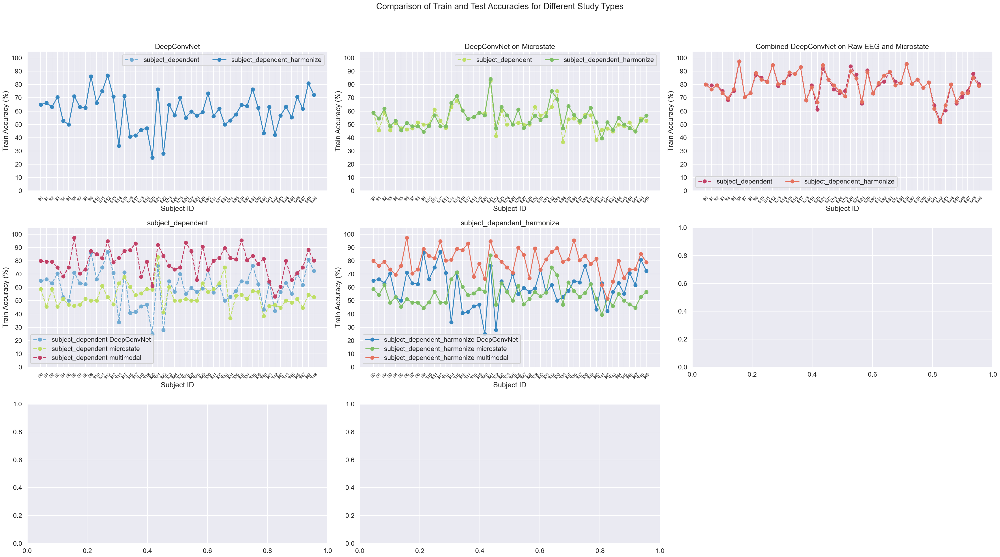

In [ ]:
# font_size= 11
# sns.set_theme(context="talk", style="darkgrid")
# fig, axes = plt.subplots(3,3, figsize=(35, 20))
# axs = axes.flatten()
# for ax, result_type in zip(axs[0:3], colors.keys()):
#     if result_type == 'raw':
#         result_type_ = 'DeepConvNet on Raw EEG'
#     elif result_type == 'microstate':
#         result_type_ = 'DeepConvNet on Microstate'
#     elif result_type == 'multimodal':
#         result_type_ = 'Combined DeepConvNet on Raw EEG and Microstate'
#     else:
#         result_type_ = result_type
#     ax.set_title(f'{result_type_}')
#     for i, (key, acc_list) in enumerate(results.items()):
#         # if key == 'subject_independent' or key =='subject_adaptive':
#         #     continue
#         if key == 'subject':
#             key_ = 'subject_dependent'
#         else:
#             key_ = key
#         ax.plot(acc_list[result_type], marker='o', linestyle=line_types[i % len(line_types)], 
#                  color=colors[result_type][key], label=f'{key_}')
#         ax.legend(ncol=2)
#         ax.set_xlabel('Subject ID')
#         ax.set_ylabel('Train Accuracy (%)')
#         ax.set_ylim(0, 105)
#         ax.set_yticks(np.arange(0, 101, 10))
#         ax.set_xticks(range(len(accuracy_list)), [f'S{i}' for i in range(len(accuracy_list))], rotation=45, fontsize=font_size)
        
# for ax, (i, (key, acc_list)) in zip(axs[3:9], enumerate(results.items())):
#     ax.set_title(f'{key}')
#     ax.set_xlabel('Subject ID')
#     ax.set_ylabel('Test Accuracy (%)')
#     ax.set_xticks(range(len(accuracy_list)))
#     ax.set_xticklabels([f'S{i}' for i in range(len(accuracy_list))], rotation=45)
#     for j, (model_type, accuracies) in enumerate(acc_list.items()):
#         ax.plot(accuracies, marker='o', linestyle=line_types[i % len(line_types)], 
#                  color=colors[model_type][key], label=f'{key} {model_type}')
#         ax.legend()
#         ax.set_xlabel('Subject ID')
#         ax.set_ylabel('Train Accuracy (%)')
#         ax.set_ylim(0, 105)
#         ax.set_yticks(np.arange(0, 101, 10))
#         ax.set_xticks(range(len(accuracy_list)), [f'S{i}' for i in range(len(accuracy_list))], rotation=45, fontsize=font_size)

# fig.delaxes(axs[-1])  # Remove the last empty subplot
# # for i, (key, acc_list) in enumerate(results.items()):
# #     for j, (model_type, accuracies) in enumerate(acc_list.items()):
# #         axs[-1].plot(accuracies, marker='o', linestyle=line_types[i % len(line_types)], 
# #                  color=colors[model_type][key], label=f'{key} {model_type}')
# #         axs[-1].legend(ncol=2)
# #         axs[-1].set_title(f'Train Accuracies for all Subjects and Study Types')
# #         axs[-1].set_xlabel('Subject ID')
# #         axs[-1].set_ylabel('Train Accuracy (%)')
# #         axs[-1].set_ylim(0, 100)
# #         axs[-1].set_yticks(np.arange(0, 101, 10))
# #         axs[-1].set_xticks(range(len(accuracy_list)), [f'S{i}' for i in range(len(accuracy_list))], rotation=45, fontsize=font_size)
        
# fig.suptitle('Comparison of Train and Test Accuracies for Different Study Types', fontsize=21)
# plt.tight_layout(rect=[0, 0.01, 1, 0.95])

# plt.savefig(os.path.join(output_path, 'test_accuracies_comparison.png'))

In [67]:
# get mean accurcy of of both combined and microstate
mean_accuracies = {}
for key, acc_list in results.items():
    mean_accuracies[key] = {}
    for model_type, accuracies in acc_list.items():
        mean_accuracies[key][model_type] = np.mean(accuracies)
print('Mean Accuracies table:')


for key, accs in mean_accuracies.items():
    print(f"{key}: {accs}")
    

Mean Accuracies table:
dependent: {'DeepConvNet': np.float64(60.22054124281292), 'microsnet': np.float64(53.44640584303897), 'multimodal_microsnet': np.float64(79.44419934640523)}
dependent_harmonize: {'DeepConvNet': np.float64(60.22054124281292), 'microsnet': np.float64(54.945373544154506), 'multimodal_microsnet': np.float64(79.48235816256327), 'multiscale_microsnet': np.float64(55.69966368126198), 'multimodal_multiscale_microsnet': np.float64(79.82072706275494), 'embedded_microsnet': np.float64(53.80582399626517), 'multimodal_embedded_microsnet': np.float64(79.71587240159221)}


### Bar plots

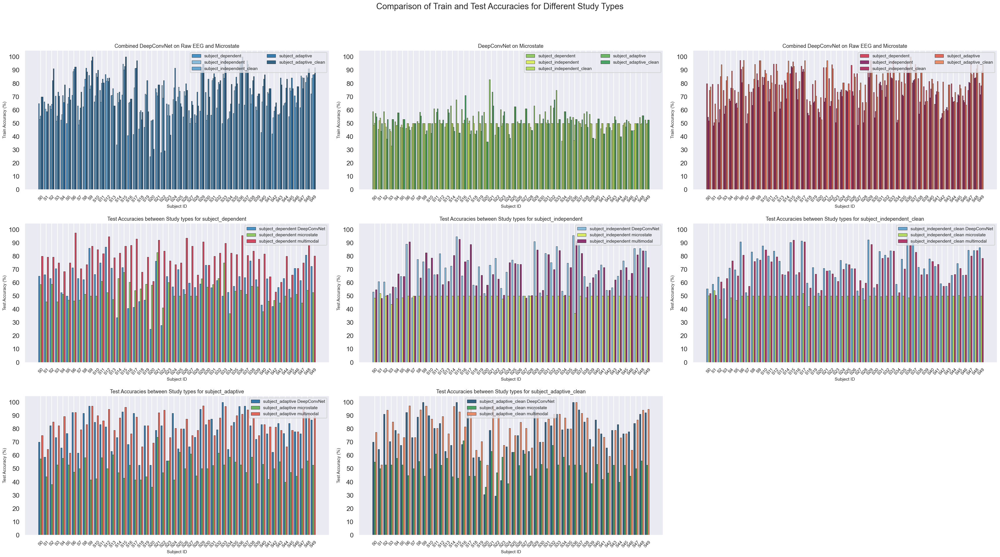

In [8]:
font_size = 11
sns.set_theme(context="talk", style="darkgrid")
fig, axes = plt.subplots(3, 3, figsize=(35, 20))
axs = axes.flatten()

# Create bar width for grouped bars
bar_width = 0.8 / len(results.keys())  # Adjust based on number of groups
x_positions = np.arange(len(accuracy_list))

# First row: Train accuracies for each result type
for ax, result_type in zip(axs[0:3], colors.keys()):
    if result_type == 'raw':
        result_type_ = 'DeepConvNet on Raw EEG'
    elif result_type == 'microstate':
        result_type_ = 'DeepConvNet on Microstate'
    elif result_type == 'multimodal':
        result_type_ = 'Combined DeepConvNet on Raw EEG and Microstate'
    
    ax.set_title(f'{result_type_}', fontsize=font_size+2)
    
    # Create grouped bars
    for i, (key, acc_list) in enumerate(results.items()):
        if key == 'subject':
            key_ = 'subject_dependent'
        else:
            key_ = key
        
        # Calculate x position for this group of bars
        x_pos = x_positions + i * bar_width
        
        ax.bar(x_pos, acc_list[result_type], 
               width=bar_width, 
               color=colors[result_type][key], 
               label=f'{key_}',
               edgecolor='black',
               linewidth=0.5)
    
    ax.legend(ncol=2, fontsize=font_size)
    ax.set_xlabel('Subject ID', fontsize=font_size)
    ax.set_ylabel('Train Accuracy (%)', fontsize=font_size)
    ax.set_ylim(0, 105)
    ax.set_yticks(np.arange(0, 101, 10))
    ax.set_xticks(x_positions + bar_width * (len(results.keys()) - 1) / 2)
    ax.set_xticklabels([f'S{i}' for i in range(len(accuracy_list))], 
                       rotation=45, fontsize=font_size)
    ax.grid(axis='y')

# Second row: Test accuracies for each study type
for ax, (i, (key, acc_list)) in zip(axs[3:9], enumerate(results.items())):
    ax.set_title(f'Test Accuracies between Study types for {key}', fontsize=font_size+2)
    ax.set_xlabel('Subject ID', fontsize=font_size)
    ax.set_ylabel('Test Accuracy (%)', fontsize=font_size)
    
    # Create grouped bars for different model types
    model_types = list(acc_list.keys())
    bar_width_model = 0.8 / len(model_types)
    
    for j, (model_type, accuracies) in enumerate(acc_list.items()):
        x_pos = x_positions + j * bar_width_model
        
        ax.bar(x_pos, accuracies, 
               width=bar_width_model, 
               color=colors[model_type][key], 
               label=f'{key} {model_type}',
               edgecolor='black',
               linewidth=0.5)
    
    ax.legend(fontsize=font_size)
    ax.set_ylim(0, 105)
    ax.set_yticks(np.arange(0, 101, 10))
    ax.set_xticks(x_positions + bar_width_model * (len(model_types) - 1) / 2)
    ax.set_xticklabels([f'S{i}' for i in range(len(accuracy_list))], 
                       rotation=45, fontsize=font_size)
    ax.grid(axis='y')
fig.delaxes(axs[-1])  # Remove the last empty subplot
# Optional: Overall comparison in the last subplot (uncomment if needed)
# for i, (key, acc_list) in enumerate(results.items()):
#     for j, (model_type, accuracies) in enumerate(acc_list.items()):
#         # Calculate position for grouped bars
#         group_pos = i * len(acc_list.keys()) + j
#         bar_width_all = 0.8 / (len(results.keys()) * len(acc_list.keys()))
#         x_pos = x_positions + group_pos * bar_width_all
#         
#         axs[-1].bar(x_pos, accuracies, 
#                    width=bar_width_all, 
#                    color=colors[model_type][key], 
#                    label=f'{key} {model_type}',
#                    alpha=0.8,
#                    edgecolor='black',
#                    linewidth=0.5)
# 
# axs[-1].legend(ncol=2, fontsize=font_size-1)
# axs[-1].set_title(f'Train Accuracies for all Subjects and Study Types', fontsize=font_size+2)
# axs[-1].set_xlabel('Subject ID', fontsize=font_size)
# axs[-1].set_ylabel('Train Accuracy (%)', fontsize=font_size)
# axs[-1].set_ylim(0, 100)
# axs[-1].set_yticks(np.arange(0, 101, 10))
# axs[-1].set_xticks(x_positions + bar_width_all * (len(results.keys()) * len(acc_list.keys()) - 1) / 2)
# axs[-1].set_xticklabels([f'S{i}' for i in range(len(accuracy_list))], 
#                        rotation=45, fontsize=font_size)
# axs[-1].grid(axis='y', alpha=0.3)

fig.suptitle('Comparison of Train and Test Accuracies for Different Study Types', fontsize=21)
plt.tight_layout(rect=[0, 0.01, 1, 0.95])

plt.savefig(os.path.join(output_path, 'test_accuracies_comparison_barplot.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

### Violin plots

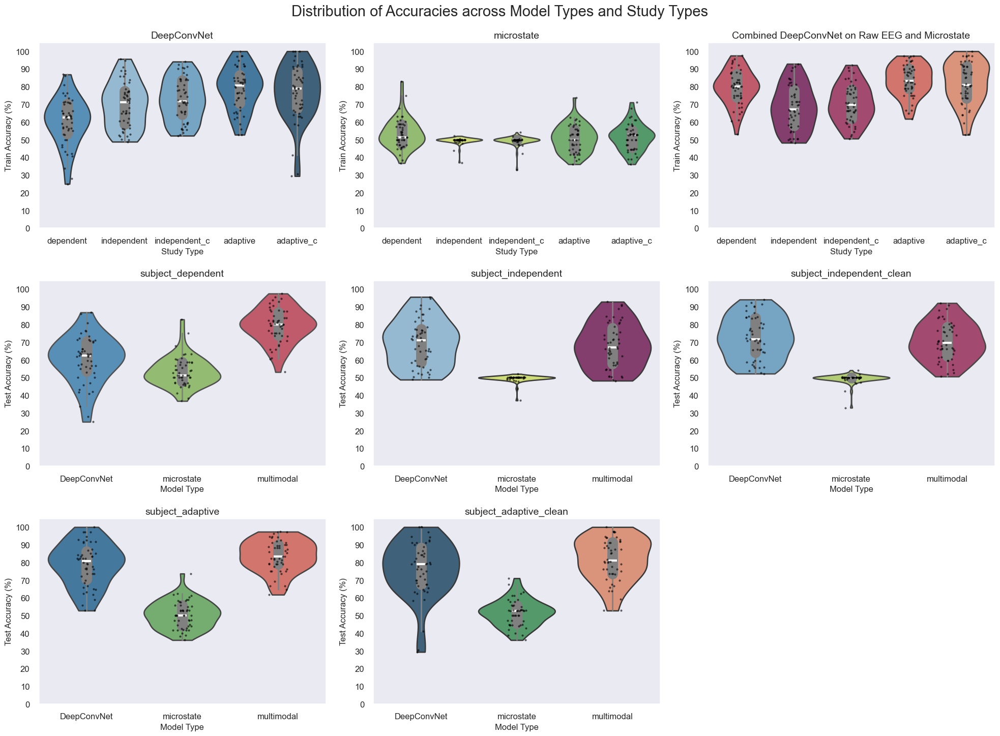

In [9]:
font_size = 12
sns.set_theme(context="talk", style="darkgrid")
fig, axes = plt.subplots(3, 3, figsize=(20, 15))
axs = axes.flatten()

# Prepare data for violin plots
def prepare_violin_data(results, result_type):
    """Prepare data in long format for violin plots"""
    data = []
    for key, acc_list in results.items():
        if key == 'subject':
            key_ = 'dependent_subject'
        else:
            key_ = key
        key_ = key_.replace('subject_', '')
        if "clean" in key_:
            key_ = key_.replace('clean', 'c')
        accuracies = acc_list[result_type]
        for i, acc in enumerate(accuracies):
            data.append({
                'Subject': f'S{i}',
                'Study_Type': key_,
                'Accuracy': acc,
                'Model_Type': result_type
            })
    return pd.DataFrame(data)

# First row: Train accuracies for each result type (violin plots)
for ax, result_type in zip(axs[0:3], colors.keys()):
    if result_type == 'raw':
        result_type_ = 'DeepConvNet'
    elif result_type == 'multimodal':
        result_type_ = 'Combined DeepConvNet on Raw EEG and Microstate'
    else:
        result_type_ = result_type
    
    ax.set_title(f'{result_type_}', fontsize=font_size+2)
    
    # Prepare data for this result type
    df = prepare_violin_data(results, result_type)
    
    # Create violin plot
    sns.violinplot(data=df, x='Study_Type', y='Accuracy', ax=ax, 
                   palette=[colors[result_type][key] for key in results.keys()],
                   inner_kws=dict(box_width=15, whis_width=2, color = '.5'), cut=0)
    
    # Add individual points
    sns.stripplot(data=df, x='Study_Type', y='Accuracy', ax=ax, 
                  color='black', alpha=0.6, size=3)
    
    ax.set_xlabel('Study Type', fontsize=font_size)
    ax.set_ylabel('Train Accuracy (%)', fontsize=font_size)
    ax.set_ylim(0, 105)
    ax.set_yticks(np.arange(0, 101, 10))
    ax.tick_params(axis='x', rotation=00, labelsize=font_size)
    ax.tick_params(axis='y', labelsize=font_size)
    ax.grid(axis='y')

# Second row: Test accuracies comparison across model types for each study type
for ax, (i, (key, acc_list)) in zip(axs[3:9], enumerate(results.items())):
    if key == 'subject':
        key_ = 'dependent_subject'
    else:
        key_ = key
    # remove "_subject"
    
    ax.set_title(f'{key_}', fontsize=font_size+2)
    
    # Prepare data for this study type across all model types
    data = []
    for model_type, accuracies in acc_list.items():
        for j, acc in enumerate(accuracies):
            data.append({
                'Subject': f'S{j}',
                'Model_Type': model_type,
                'Accuracy': acc,
                'Study_Type': key_
            })
    
    df = pd.DataFrame(data)
    
    # Create violin plot with model types on x-axis
    model_colors = [colors[model_type][key] for model_type in acc_list.keys()]
    sns.violinplot(data=df, x='Model_Type', y='Accuracy', ax=ax, 
                   palette=model_colors, inner_kws=dict(box_width=15, whis_width=2, color = '.5'), cut=0)
    
    # Add individual points
    sns.stripplot(data=df, x='Model_Type', y='Accuracy', ax=ax, 
                  color='black', alpha=0.6, size=3)
    
    ax.set_xlabel('Model Type', fontsize=font_size)
    ax.set_ylabel('Test Accuracy (%)', fontsize=font_size)
    ax.set_ylim(0, 105)
    ax.set_yticks(np.arange(0, 101, 10))
    ax.tick_params(axis='x', rotation=0, labelsize=font_size)
    ax.tick_params(axis='y', labelsize=font_size)
    ax.grid(axis='y')
fig.delaxes(axs[-1])  # Remove the last empty subplot
# Optional: Overall comparison violin plot (uncomment if needed)
# # Prepare data for overall comparison
# all_data = []
# for key, acc_list in results.items():
#     if key == 'subject':
#         key_ = 'subject_dependent'
#     else:
#         key_ = key
#     
#     for model_type, accuracies in acc_list.items():
#         for j, acc in enumerate(accuracies):
#             all_data.append({
#                 'Subject': f'S{j}',
#                 'Model_Type': model_type,
#                 'Study_Type': key_,
#                 'Accuracy': acc,
#                 'Combined_Label': f'{key_}_{model_type}'
#             })
# 
# df_all = pd.DataFrame(all_data)
# 
# # Create comprehensive violin plot
# sns.violinplot(data=df_all, x='Combined_Label', y='Accuracy', ax=axs[-1], 
#                inner='box', cut=0)
# sns.stripplot(data=df_all, x='Combined_Label', y='Accuracy', ax=axs[-1], 
#               color='black', alpha=0.4, size=2)
# 
# axs[-1].set_title('Train Accuracies for all Study Types and Model Types', fontsize=font_size+2)
# axs[-1].set_xlabel('Study Type - Model Type', fontsize=font_size)
# axs[-1].set_ylabel('Train Accuracy (%)', fontsize=font_size)
# axs[-1].set_ylim(0, 100)
# axs[-1].set_yticks(np.arange(0, 101, 10))
# axs[-1].tick_params(axis='x', rotation=45, labelsize=font_size-1)
# axs[-1].tick_params(axis='y', labelsize=font_size)
# axs[-1].grid(axis='y', alpha=0.3)

fig.suptitle('Distribution of Accuracies across Model Types and Study Types', fontsize=21)
plt.tight_layout(rect=[0, 0.01, 1, 1])

plt.savefig(os.path.join(output_path, 'accuracies_violin_plots.png'), 
            dpi=300, bbox_inches='tight')
plt.show()

## Statistical significance of results

### Checking for statistical significance comparing model types within each study type

In [10]:
stats_output_path = '../Output/ica_rest_all/results_all/statistical_analysis/'

In [11]:
stats_model = msf.perform_statistical_tests(results, type_wise="model", output_path=stats_output_path)

STATISTICAL ANALYSIS OF MODEL TYPE COMPARISONS
Testing whether there are significant differences between model types
within each study type using repeated measures ANOVA.


STATISTICAL ANALYSIS FOR: SUBJECT_DEPENDENT

STATISTICAL ANALYSIS FOR: SUBJECT_INDEPENDENT

STATISTICAL ANALYSIS FOR: SUBJECT_INDEPENDENT_CLEAN

STATISTICAL ANALYSIS FOR: SUBJECT_ADAPTIVE

STATISTICAL ANALYSIS FOR: SUBJECT_ADAPTIVE_CLEAN

1. DESCRIPTIVE STATISTICS:
----------------------------------------
                 count   mean    std    min    max
Comparison_Type                                   
DeepConvNet         50  60.22  13.46  25.00  86.84
microstate          50  53.45   8.44  36.76  82.89
multimodal          50  79.44   9.74  53.12  97.50

2. ASSUMPTION CHECKS:
----------------------------------------
Normality test (DeepConvNet): W=0.9725, p=0.2927
Normality test (microstate): W=0.9395, p=0.0129
Normality test (multimodal): W=0.9799, p=0.5483
Levene's test (homogeneity): W=3.8789, p=0.0228

3. REPE

Creating plots for model type comparisons...
Creating statistical plots for MODEL TYPE comparisons...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...


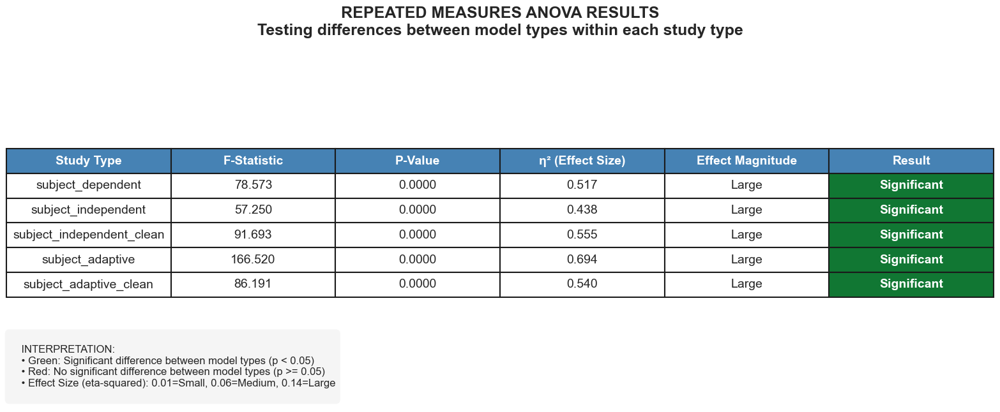

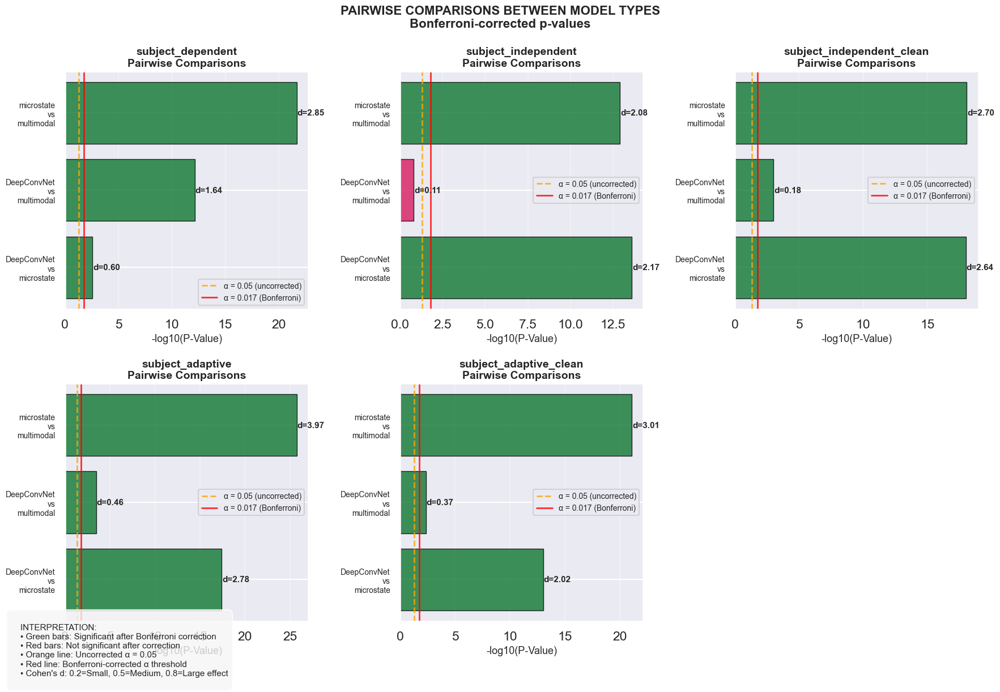

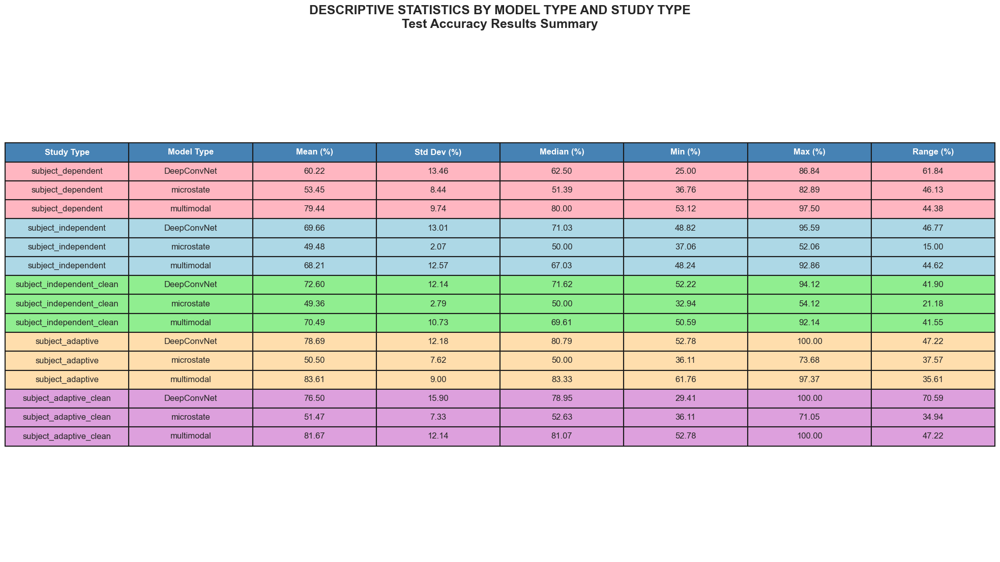

✓ Model comparison plots saved:
  - statistical_analysis_1_anova.png
  - statistical_analysis_2_pairwise.png
  - statistical_analysis_3_descriptive.png




In [12]:
# For comparing model types within each study type
print("Creating plots for model type comparisons...")
results_model_plots = msf.create_statistical_plots(results, type_wise="model", output_path=stats_output_path)
print("✓ Model comparison plots saved:")
print("  - statistical_analysis_1_anova.png")
print("  - statistical_analysis_2_pairwise.png") 
print("  - statistical_analysis_3_descriptive.png")

print("\n" + "="*60 + "\n")



### Checking for significant differences between model types across all study types

In [13]:
stats_subject = msf.perform_statistical_tests(results, type_wise="subject", output_path=stats_output_path)

STATISTICAL ANALYSIS OF STUDY TYPE COMPARISONS
Testing whether there are significant differences between study types
within each model type using repeated measures ANOVA.


STATISTICAL ANALYSIS FOR: MICROSTATE

STATISTICAL ANALYSIS FOR: MULTIMODAL

STATISTICAL ANALYSIS FOR: DEEPCONVNET

1. DESCRIPTIVE STATISTICS:
----------------------------------------
                           count   mean   std    min    max
Comparison_Type                                            
subject_adaptive              50  50.50  7.62  36.11  73.68
subject_adaptive_clean        50  51.47  7.33  36.11  71.05
subject_dependent             50  53.45  8.44  36.76  82.89
subject_independent           50  49.48  2.07  37.06  52.06
subject_independent_clean     50  49.36  2.79  32.94  54.12

2. ASSUMPTION CHECKS:
----------------------------------------
Normality test (subject_dependent): W=0.9395, p=0.0129
Normality test (subject_independent): W=0.3655, p=0.0000
Normality test (subject_independent_clean): W=0.

Creating plots for study type comparisons...
Creating statistical plots for STUDY TYPE comparisons...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...
Repeated measures ANOVA failed: 'SS'
Falling back to one-way ANOVA...


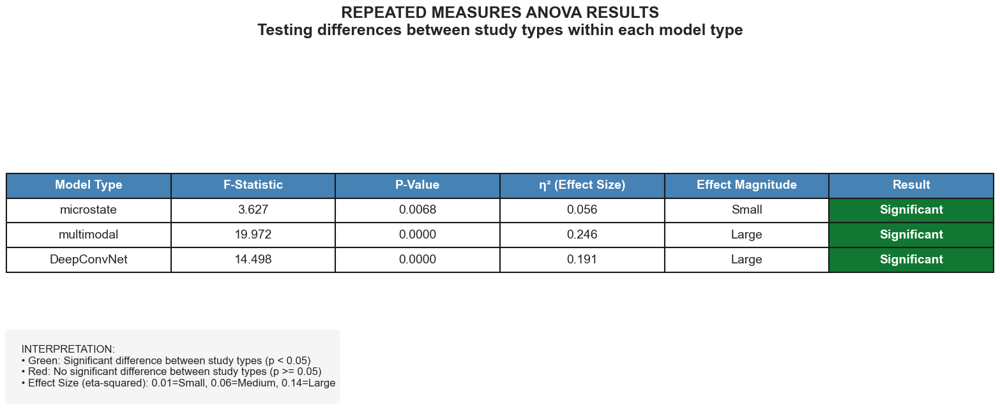

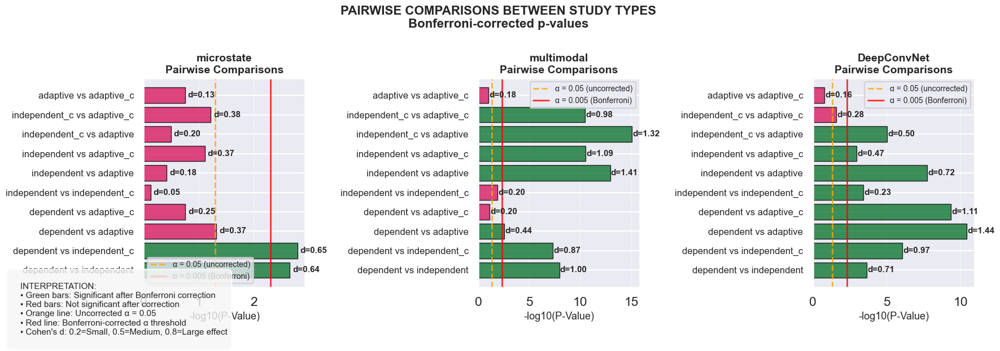

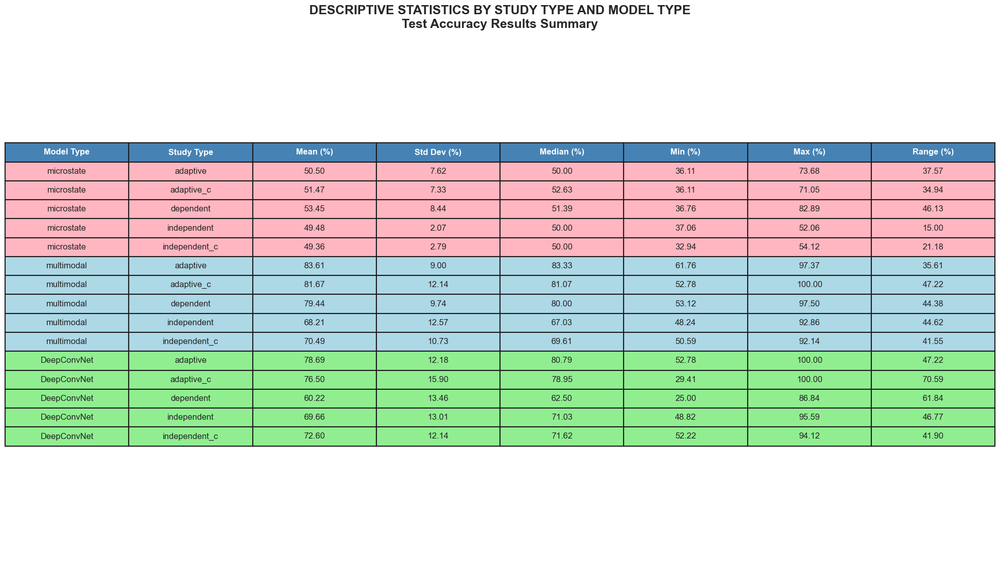

✓ Study type comparison plots saved:
  - statistical_analysis_1_anova_study_types.png
  - statistical_analysis_2_pairwise_study_types.png
  - statistical_analysis_3_descriptive_study_types.png


In [14]:
# For comparing study types within each model type  
print("Creating plots for study type comparisons...")
results_subject_plots = msf.create_statistical_plots(results, type_wise="subject", output_path=stats_output_path)
print("✓ Study type comparison plots saved:")
print("  - statistical_analysis_1_anova_study_types.png")
print("  - statistical_analysis_2_pairwise_study_types.png") 
print("  - statistical_analysis_3_descriptive_study_types.png")

### Power analysis

In [15]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import ttest_rel, wilcoxon, friedmanchisquare
import statsmodels.api as sm
from statsmodels.stats.contingency_tables import mcnemar
from statsmodels.stats.multitest import multipletests
import seaborn as sns
from itertools import combinations
import os

def improved_statistical_analysis(results, output_path):
    """
    More appropriate statistical analysis with better power considerations
    """
    
    # Store all results
    all_results = {}
    
    # Reorganize data by model type
    model_types = set()
    study_types = list(results.keys())
    
    for study_type, model_accuracies in results.items():
        model_types.update(model_accuracies.keys())
    
    model_types = list(model_types)
    
    print("IMPROVED STATISTICAL ANALYSIS")
    print("=" * 60)
    print("Using more appropriate tests with better statistical power")
    print()
    
    for model_type in model_types:
        print(f"\n{'='*50}")
        print(f"ANALYSIS FOR: {model_type.upper()}")
        print(f"{'='*50}")
        
        # Prepare data
        study_accuracies = {}
        n_subjects = None
        
        for study_type in study_types:
            if model_type in results[study_type]:
                study_name = 'subject_dependent' if study_type == 'subject' else study_type
                study_name_clean = study_name.replace('subject_', '').replace('_subject', '').replace('clean', 'c')
                study_accuracies[study_name_clean] = results[study_type][model_type]
                if n_subjects is None:
                    n_subjects = len(results[study_type][model_type])
        
        if len(study_accuracies) < 2:
            print(f"Insufficient data for {model_type}")
            continue
            
        study_names = list(study_accuracies.keys())
        
        print(f"Comparing {len(study_names)} study types: {', '.join(study_names)}")
        print(f"Sample size: {n_subjects} subjects")
        
        # =================================================================
        # APPROACH 1: PLANNED COMPARISONS (Much better power)
        # =================================================================
        print(f"\n1. PLANNED COMPARISONS (Recommended)")
        print("-" * 40)
        
        # Define meaningful planned comparisons based on research questions
        planned_comparisons = []
        
        # Common planned comparisons in ML studies:
        if 'dependent' in study_names and 'independent' in study_names:
            planned_comparisons.append(('dependent', 'independent', 'Subject Dependency Effect'))
        
        if 'c' in study_names:
            # Compare clean vs each other condition
            for study in study_names:
                if study != 'c':
                    planned_comparisons.append(('c', study, f'Clean vs {study.title()}'))
        
        # If we have multiple independent types, compare them
        independent_types = [s for s in study_names if 'independent' in s]
        if len(independent_types) > 1:
            for i, study1 in enumerate(independent_types):
                for study2 in independent_types[i+1:]:
                    planned_comparisons.append((study1, study2, f'{study1} vs {study2}'))
        
        # Perform planned comparisons with Bonferroni correction
        if planned_comparisons:
            alpha_planned = 0.05 / len(planned_comparisons)
            print(f"Number of planned comparisons: {len(planned_comparisons)}")
            print(f"Bonferroni-corrected α = {alpha_planned:.4f}")
            print()
            
            planned_results = []
            for study1, study2, description in planned_comparisons:
                if study1 in study_accuracies and study2 in study_accuracies:
                    data1 = study_accuracies[study1]
                    data2 = study_accuracies[study2]
                    
                    # Paired t-test
                    t_stat, p_val = ttest_rel(data1, data2)
                    
                    # Effect size (Cohen's d for paired samples)
                    diff = np.array(data1) - np.array(data2)
                    cohens_d = np.mean(diff) / np.std(diff, ddof=1)
                    
                    # Confidence interval for the difference
                    se_diff = np.std(diff, ddof=1) / np.sqrt(len(diff))
                    t_crit = stats.t.ppf(0.975, len(diff) - 1)
                    ci_lower = np.mean(diff) - t_crit * se_diff
                    ci_upper = np.mean(diff) + t_crit * se_diff
                    
                    significant = p_val < alpha_planned
                    
                    planned_results.append({
                        'comparison': description,
                        'mean_diff': np.mean(diff),
                        'ci_lower': ci_lower,
                        'ci_upper': ci_upper,
                        't_stat': t_stat,
                        'p_value': p_val,
                        'cohens_d': cohens_d,
                        'significant': significant
                    })
                    
                    print(f"{description}:")
                    print(f"  Mean difference: {np.mean(diff):.3f} ({ci_lower:.3f} to {ci_upper:.3f})")
                    print(f"  t({len(diff)-1}) = {t_stat:.3f}, p = {p_val:.4f}")
                    print(f"  Cohen's d = {cohens_d:.3f}")
                    print(f"  {'✓ SIGNIFICANT' if significant else '✗ Not significant'} (α = {alpha_planned:.4f})")
                    print()
        
        # =================================================================
        # APPROACH 2: NON-PARAMETRIC ALTERNATIVE (Robust to assumptions)
        # =================================================================
        print(f"\n2. NON-PARAMETRIC ANALYSIS")
        print("-" * 40)
        
        if len(study_names) > 2:
            # Friedman test (non-parametric alternative to repeated measures ANOVA)
            study_data_array = np.array([study_accuracies[name] for name in study_names]).T
            friedman_stat, friedman_p = friedmanchisquare(*study_data_array.T)
            
            print(f"Friedman test (non-parametric ANOVA alternative):")
            print(f"χ²({len(study_names)-1}) = {friedman_stat:.3f}, p = {friedman_p:.4f}")
            
            if friedman_p < 0.05:
                print("✓ SIGNIFICANT differences detected")
                
                # Post-hoc Wilcoxon signed-rank tests
                print(f"\nPost-hoc Wilcoxon signed-rank tests:")
                wilcoxon_results = []
                comparisons = list(combinations(study_names, 2))
                alpha_wilcoxon = 0.05 / len(comparisons)
                
                for study1, study2 in comparisons:
                    data1 = study_accuracies[study1]
                    data2 = study_accuracies[study2]
                    
                    w_stat, w_p = wilcoxon(data1, data2)
                    significant = w_p < alpha_wilcoxon
                    
                    # Effect size (r = Z / sqrt(N))
                    z_score = stats.norm.ppf(w_p/2)  # approximate
                    effect_r = abs(z_score) / np.sqrt(n_subjects)
                    
                    wilcoxon_results.append({
                        'comparison': f'{study1} vs {study2}',
                        'w_stat': w_stat,
                        'p_value': w_p,
                        'effect_r': effect_r,
                        'significant': significant
                    })
                    
                    print(f"  {study1} vs {study2}: W = {w_stat:.1f}, p = {w_p:.4f} {'✓' if significant else '✗'}")
            else:
                print("✗ No significant differences detected")
        
        # =================================================================
        # APPROACH 3: EFFECT SIZE FOCUS (Clinical significance)
        # =================================================================
        print(f"\n3. EFFECT SIZE ANALYSIS (Clinical Significance)")
        print("-" * 40)
        
        print("Effect sizes for all pairwise comparisons:")
        print("(Regardless of statistical significance)")
        print()
        
        effect_summary = []
        for study1, study2 in combinations(study_names, 2):
            data1 = study_accuracies[study1]
            data2 = study_accuracies[study2]
            
            diff = np.array(data1) - np.array(data2)
            cohens_d = np.mean(diff) / np.std(diff, ddof=1)
            mean_diff = np.mean(diff)
            
            # Interpret effect size
            if abs(cohens_d) >= 0.8:
                magnitude = "Large"
            elif abs(cohens_d) >= 0.5:
                magnitude = "Medium"
            elif abs(cohens_d) >= 0.2:
                magnitude = "Small"
            else:
                magnitude = "Negligible"
            
            effect_summary.append({
                'comparison': f'{study1} vs {study2}',
                'mean_diff': mean_diff,
                'cohens_d': cohens_d,
                'magnitude': magnitude
            })
            
            print(f"{study1} vs {study2}:")
            print(f"  Mean difference: {mean_diff:.3f}%")
            print(f"  Cohen's d: {cohens_d:.3f} ({magnitude})")
            print()
        
        # =================================================================
        # APPROACH 4: POWER ANALYSIS
        # =================================================================
        print(f"\n4. POWER ANALYSIS")
        print("-" * 40)
        
        # Calculate achieved power for detecting medium effects
        from statsmodels.stats.power import ttest_power
        
        medium_effect = 0.5  # Cohen's d = 0.5
        alpha = 0.05
        
        achieved_power = ttest_power(medium_effect, n_subjects, alpha, alternative='two-sided')
        
        print(f"Sample size: {n_subjects}")
        print(f"Power to detect medium effect (d=0.5): {achieved_power:.3f}")
        
        if achieved_power < 0.8:
            print("⚠️  WARNING: Low power to detect medium effects!")
            # Calculate required sample size
            from statsmodels.stats.power import tt_solve_power
            required_n = tt_solve_power(medium_effect, power=0.8, alpha=alpha)
            print(f"   Recommended sample size for 80% power: {int(np.ceil(required_n))}")
        else:
            print("✓ Adequate power to detect medium effects")
        
        # Store results
        all_results[model_type] = {
            'planned_comparisons': planned_results if 'planned_results' in locals() else [],
            'friedman_test': {'statistic': friedman_stat, 'p_value': friedman_p} if 'friedman_stat' in locals() else None,
            'wilcoxon_results': wilcoxon_results if 'wilcoxon_results' in locals() else [],
            'effect_sizes': effect_summary,
            'achieved_power': achieved_power,
            'sample_size': n_subjects
        }
    
    return all_results

# Run the improved analysis
improved_results = improved_statistical_analysis(results, output_path)

print(f"\n{'='*60}")
print("STATISTICAL RECOMMENDATIONS")
print(f"{'='*60}")
print("1. PLANNED COMPARISONS are most powerful - focus on specific hypotheses")
print("2. Use NON-PARAMETRIC tests if normality assumptions are violated") 
print("3. Report EFFECT SIZES regardless of p-values")
print("4. Consider POWER ANALYSIS for future studies")
print("5. Avoid exploratory multiple testing when possible")
print(f"{'='*60}")

IMPROVED STATISTICAL ANALYSIS
Using more appropriate tests with better statistical power


ANALYSIS FOR: MICROSTATE
Comparing 5 study types: dependent, independent, independent_c, adaptive, adaptive_c
Sample size: 50 subjects

1. PLANNED COMPARISONS (Recommended)
----------------------------------------
Number of planned comparisons: 2
Bonferroni-corrected α = 0.0250

Subject Dependency Effect:
  Mean difference: 3.962 (1.495 to 6.428)
  t(49) = 3.227, p = 0.0022
  Cohen's d = 0.456
  ✓ SIGNIFICANT (α = 0.0250)

independent vs independent_c:
  Mean difference: 0.125 (-0.640 to 0.889)
  t(49) = 0.328, p = 0.7446
  Cohen's d = 0.046
  ✗ Not significant (α = 0.0250)


2. NON-PARAMETRIC ANALYSIS
----------------------------------------
Friedman test (non-parametric ANOVA alternative):
χ²(4) = 14.358, p = 0.0062
✓ SIGNIFICANT differences detected

Post-hoc Wilcoxon signed-rank tests:
  dependent vs independent: W = 231.0, p = 0.0035 ✓
  dependent vs independent_c: W = 254.5, p = 0.0030 ✓
  

Creating improved statistical analysis plots...


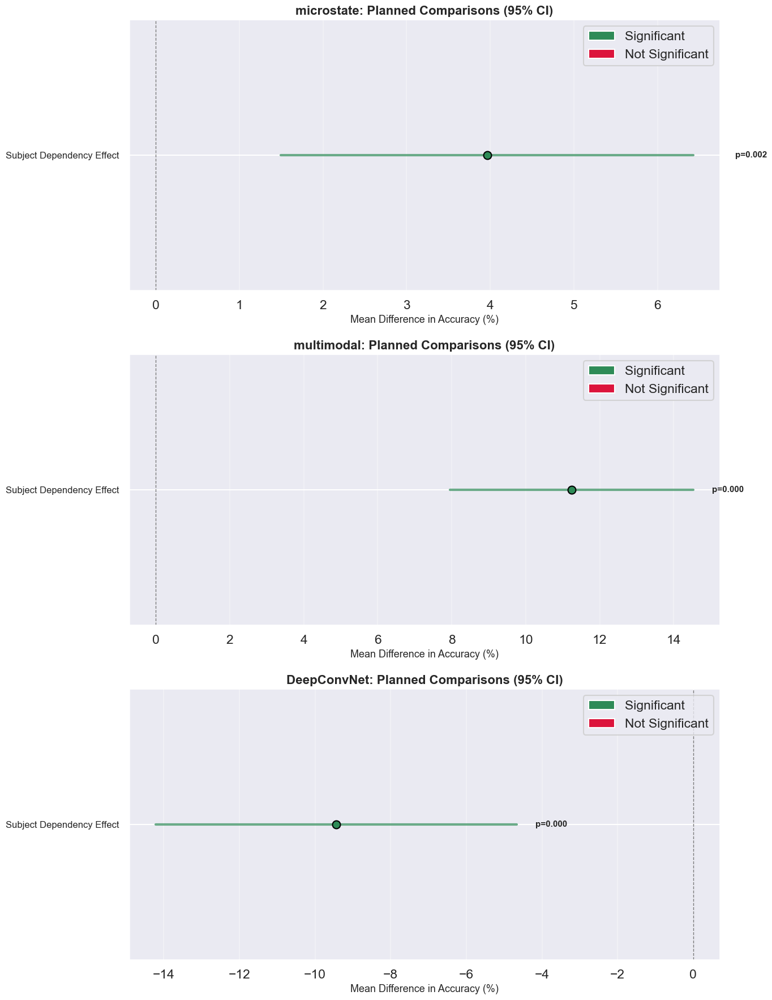

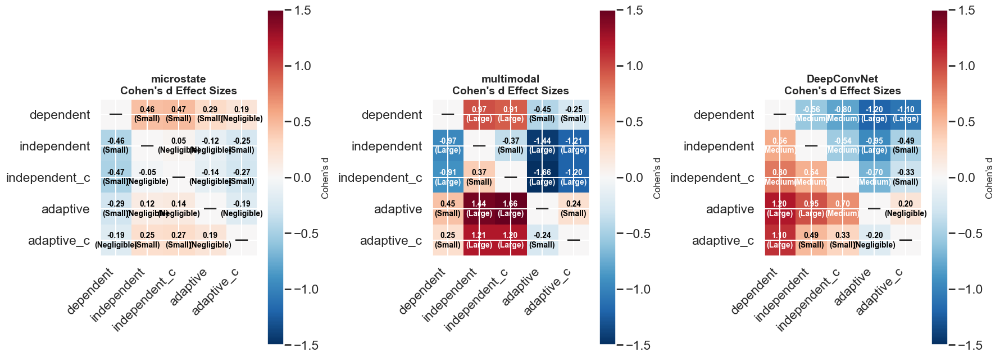

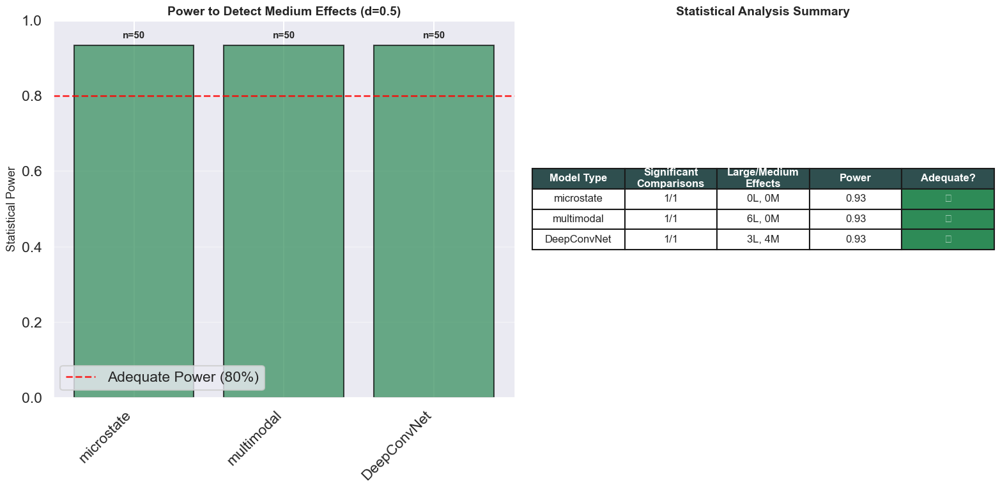

✓ Improved statistical plots saved:
  - improved_stats_1_planned_comparisons.png
  - improved_stats_2_effect_sizes.png
  - improved_stats_3_power_summary.png


In [16]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import ttest_rel, wilcoxon, friedmanchisquare
import statsmodels.api as sm
from statsmodels.stats.power import ttest_power, tt_solve_power
from statsmodels.stats.multitest import multipletests
import seaborn as sns
from itertools import combinations
import os

def create_improved_statistical_plots(results, output_path):
    """
    Create comprehensive plots for the improved statistical analysis
    """
    
    # Define color schemes
    colors = {
        'significant': '#2E8B57',     # Sea green
        'not_significant': '#DC143C',  # Crimson
        'medium_effect': '#FF8C00',    # Dark orange
        'large_effect': '#8B0000',     # Dark red
        'small_effect': '#4682B4',     # Steel blue
        'negligible': '#808080',       # Gray
        'background': '#F5F5F5',       # White smoke
        'header': '#2F4F4F'           # Dark slate gray
    }
    
    # Process data and run analysis
    model_types = set()
    study_types = list(results.keys())
    
    for study_type, model_accuracies in results.items():
        model_types.update(model_accuracies.keys())
    
    model_types = list(model_types)
    all_results = {}
    
    # Run the statistical analysis for each model type
    for model_type in model_types:
        study_accuracies = {}
        n_subjects = None
        
        for study_type in study_types:
            if model_type in results[study_type]:
                study_name = 'subject_dependent' if study_type == 'subject' else study_type
                study_name_clean = study_name.replace('subject_', '').replace('_subject', '').replace('clean', 'c')
                study_accuracies[study_name_clean] = results[study_type][model_type]
                if n_subjects is None:
                    n_subjects = len(results[study_type][model_type])
        
        if len(study_accuracies) < 2:
            continue
            
        study_names = list(study_accuracies.keys())
        
        # Planned comparisons
        planned_results = []
        planned_comparisons = []
        
        # Define meaningful planned comparisons
        if 'dependent' in study_names and 'independent' in study_names:
            planned_comparisons.append(('dependent', 'independent', 'Subject Dependency Effect'))
        
        if 'c' in study_names:
            for study in study_names:
                if study != 'c':
                    planned_comparisons.append(('c', study, f'Clean vs {study.title()}'))
        
        # Perform planned comparisons
        if planned_comparisons:
            alpha_planned = 0.05 / len(planned_comparisons)
            
            for study1, study2, description in planned_comparisons:
                if study1 in study_accuracies and study2 in study_accuracies:
                    data1 = study_accuracies[study1]
                    data2 = study_accuracies[study2]
                    
                    t_stat, p_val = ttest_rel(data1, data2)
                    diff = np.array(data1) - np.array(data2)
                    cohens_d = np.mean(diff) / np.std(diff, ddof=1)
                    
                    se_diff = np.std(diff, ddof=1) / np.sqrt(len(diff))
                    t_crit = stats.t.ppf(0.975, len(diff) - 1)
                    ci_lower = np.mean(diff) - t_crit * se_diff
                    ci_upper = np.mean(diff) + t_crit * se_diff
                    
                    planned_results.append({
                        'comparison': description,
                        'mean_diff': np.mean(diff),
                        'ci_lower': ci_lower,
                        'ci_upper': ci_upper,
                        't_stat': t_stat,
                        'p_value': p_val,
                        'cohens_d': cohens_d,
                        'significant': p_val < alpha_planned
                    })
        
        # Effect sizes for all comparisons
        effect_summary = []
        for study1, study2 in combinations(study_names, 2):
            data1 = study_accuracies[study1]
            data2 = study_accuracies[study2]
            
            diff = np.array(data1) - np.array(data2)
            cohens_d = np.mean(diff) / np.std(diff, ddof=1)
            mean_diff = np.mean(diff)
            
            if abs(cohens_d) >= 0.8:
                magnitude = "Large"
            elif abs(cohens_d) >= 0.5:
                magnitude = "Medium"
            elif abs(cohens_d) >= 0.2:
                magnitude = "Small"
            else:
                magnitude = "Negligible"
            
            effect_summary.append({
                'comparison': f'{study1} vs {study2}',
                'mean_diff': mean_diff,
                'cohens_d': cohens_d,
                'magnitude': magnitude
            })
        
        # Power analysis
        medium_effect = 0.5
        alpha = 0.05
        achieved_power = ttest_power(medium_effect, n_subjects, alpha, alternative='two-sided')
        
        all_results[model_type] = {
            'planned_comparisons': planned_results,
            'effect_sizes': effect_summary,
            'achieved_power': achieved_power,
            'sample_size': n_subjects,
            'study_names': study_names
        }
    
    # =============================================================================
    # PLOT 1: PLANNED COMPARISONS RESULTS
    # =============================================================================
    
    fig1, axes = plt.subplots(len(model_types), 1, figsize=(14, 6*len(model_types)))
    if len(model_types) == 1:
        axes = [axes]
    
    for idx, model_type in enumerate(model_types):
        ax = axes[idx]
        results_data = all_results[model_type]
        planned_comps = results_data['planned_comparisons']
        
        if not planned_comps:
            ax.text(0.5, 0.5, f'No planned comparisons\navailable for {model_type}', 
                   ha='center', va='center', transform=ax.transAxes, fontsize=14)
            ax.set_title(f'{model_type}: Planned Comparisons', fontsize=16, fontweight='bold')
            continue
        
        # Create forest plot style visualization
        comparisons = [p['comparison'] for p in planned_comps]
        mean_diffs = [p['mean_diff'] for p in planned_comps]
        ci_lowers = [p['ci_lower'] for p in planned_comps]
        ci_uppers = [p['ci_upper'] for p in planned_comps]
        p_values = [p['p_value'] for p in planned_comps]
        significant = [p['significant'] for p in planned_comps]
        
        # Plot confidence intervals
        y_positions = range(len(comparisons))
        
        for i, (mean_diff, ci_low, ci_up, sig) in enumerate(zip(mean_diffs, ci_lowers, ci_uppers, significant)):
            color = colors['significant'] if sig else colors['not_significant']
            
            # Plot CI line
            ax.plot([ci_low, ci_up], [i, i], color=color, linewidth=3, alpha=0.7)
            
            # Plot mean point
            ax.scatter([mean_diff], [i], color=color, s=100, zorder=5, edgecolor='black')
            
            # Add p-value annotation
            ax.text(max(ci_up, mean_diff) + 0.5, i, f'p={p_values[i]:.3f}', 
                   va='center', fontsize=11, fontweight='bold')
        
        # Add reference line at 0
        ax.axvline(x=0, color='black', linestyle='--', alpha=0.5, linewidth=1)
        
        # Formatting
        ax.set_yticks(y_positions)
        ax.set_yticklabels([c.replace(' vs ', '\nvs ') for c in comparisons], fontsize=12)
        ax.set_xlabel('Mean Difference in Accuracy (%)', fontsize=13)
        ax.set_title(f'{model_type}: Planned Comparisons (95% CI)', fontsize=16, fontweight='bold')
        ax.grid(axis='x', alpha=0.3)
        
        # Add legend
        sig_patch = plt.Rectangle((0,0),1,1, facecolor=colors['significant'], label='Significant')
        nonsig_patch = plt.Rectangle((0,0),1,1, facecolor=colors['not_significant'], label='Not Significant')
        ax.legend(handles=[sig_patch, nonsig_patch], loc='upper right')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, 'improved_stats_1_planned_comparisons.png'), 
                dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    
    # =============================================================================
    # PLOT 2: EFFECT SIZES HEATMAP
    # =============================================================================
    
    fig2, axes = plt.subplots(1, len(model_types), figsize=(6*len(model_types), 8))
    if len(model_types) == 1:
        axes = [axes]
    
    for idx, model_type in enumerate(model_types):
        ax = axes[idx]
        results_data = all_results[model_type]
        effect_data = results_data['effect_sizes']
        study_names = results_data['study_names']
        
        if not effect_data:
            ax.text(0.5, 0.5, f'No effect size data\navailable for {model_type}', 
                   ha='center', va='center', transform=ax.transAxes, fontsize=14)
            ax.set_title(f'{model_type}: Effect Sizes', fontsize=16, fontweight='bold')
            continue
        
        # Create effect size matrix
        n_studies = len(study_names)
        effect_matrix = np.zeros((n_studies, n_studies))
        magnitude_matrix = np.full((n_studies, n_studies), '', dtype=object)
        
        for effect in effect_data:
            comp = effect['comparison']
            study1, study2 = comp.split(' vs ')
            i, j = study_names.index(study1), study_names.index(study2)
            
            effect_matrix[i, j] = effect['cohens_d']
            effect_matrix[j, i] = -effect['cohens_d']  # Symmetric with opposite sign
            
            magnitude_matrix[i, j] = effect['magnitude']
            magnitude_matrix[j, i] = effect['magnitude']
        
        # Create heatmap
        im = ax.imshow(effect_matrix, cmap='RdBu_r', vmin=-1.5, vmax=1.5, aspect='equal')
        
        # Add text annotations
        for i in range(n_studies):
            for j in range(n_studies):
                if i != j:
                    text_color = 'white' if abs(effect_matrix[i, j]) > 0.5 else 'black'
                    ax.text(j, i, f'{effect_matrix[i, j]:.2f}\n({magnitude_matrix[i, j]})', 
                           ha='center', va='center', fontsize=10, fontweight='bold',
                           color=text_color)
                else:
                    ax.text(j, i, '—', ha='center', va='center', fontsize=16, fontweight='bold')
        
        # Formatting
        ax.set_xticks(range(n_studies))
        ax.set_yticks(range(n_studies))
        ax.set_xticklabels(study_names, rotation=45, ha='right')
        ax.set_yticklabels(study_names)
        ax.set_title(f'{model_type}\nCohen\'s d Effect Sizes', fontsize=14, fontweight='bold')
        
        # Add colorbar
        cbar = plt.colorbar(im, ax=ax, shrink=0.8)
        cbar.set_label('Cohen\'s d', fontsize=12)
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, 'improved_stats_2_effect_sizes.png'), 
                dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    
    # =============================================================================
    # PLOT 3: POWER ANALYSIS AND SUMMARY
    # =============================================================================
    
    fig3, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))
    
    # Power analysis plot
    model_names = list(all_results.keys())
    powers = [all_results[m]['achieved_power'] for m in model_names]
    sample_sizes = [all_results[m]['sample_size'] for m in model_names]
    
    colors_power = [colors['significant'] if p >= 0.8 else colors['not_significant'] for p in powers]
    
    bars = ax1.bar(range(len(model_names)), powers, color=colors_power, alpha=0.7, edgecolor='black')
    ax1.axhline(y=0.8, color='red', linestyle='--', alpha=0.8, linewidth=2, label='Adequate Power (80%)')
    
    # Add sample size annotations
    for i, (bar, n) in enumerate(zip(bars, sample_sizes)):
        ax1.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.02, 
                f'n={n}', ha='center', fontsize=11, fontweight='bold')
    
    ax1.set_xticks(range(len(model_names)))
    ax1.set_xticklabels(model_names, rotation=45, ha='right')
    ax1.set_ylabel('Statistical Power', fontsize=13)
    ax1.set_title('Power to Detect Medium Effects (d=0.5)', fontsize=14, fontweight='bold')
    ax1.set_ylim(0, 1)
    ax1.legend()
    ax1.grid(axis='y', alpha=0.3)
    
    # Summary table
    ax2.axis('off')
    
    summary_data = []
    for model_type in model_names:
        results_data = all_results[model_type]
        n_planned = len(results_data['planned_comparisons'])
        n_significant = sum(1 for p in results_data['planned_comparisons'] if p['significant'])
        power = results_data['achieved_power']
        
        # Count effect sizes
        large_effects = sum(1 for e in results_data['effect_sizes'] if e['magnitude'] == 'Large')
        medium_effects = sum(1 for e in results_data['effect_sizes'] if e['magnitude'] == 'Medium')
        
        summary_data.append([
            model_type,
            f"{n_significant}/{n_planned}",
            f"{large_effects}L, {medium_effects}M",
            f"{power:.2f}",
            "✓" if power >= 0.8 else "⚠️"
        ])
    
    summary_df = pd.DataFrame(summary_data, columns=[
        'Model Type', 'Significant\nComparisons', 'Large/Medium\nEffects', 'Power', 'Adequate?'
    ])
    
    table = ax2.table(cellText=summary_df.values, colLabels=summary_df.columns,
                     cellLoc='center', loc='center')
    table.auto_set_font_size(False)
    table.set_fontsize(12)
    table.scale(1, 2)
    
    # Color code the table
    for i in range(len(summary_data)):
        for j in range(len(summary_df.columns)):
            if j == len(summary_df.columns) - 1:  # Adequate power column
                if "✓" in summary_data[i][j]:
                    table[(i+1, j)].set_facecolor(colors['significant'])
                else:
                    table[(i+1, j)].set_facecolor(colors['not_significant'])
                table[(i+1, j)].set_text_props(weight='bold', color='white')
    
    # Header styling
    for j in range(len(summary_df.columns)):
        table[(0, j)].set_facecolor(colors['header'])
        table[(0, j)].set_text_props(weight='bold', color='white')
    
    ax2.set_title('Statistical Analysis Summary', fontsize=14, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(os.path.join(output_path, 'improved_stats_3_power_summary.png'), 
                dpi=300, bbox_inches='tight', facecolor='white')
    plt.show()
    
    return all_results

# Run the improved plotting
print("Creating improved statistical analysis plots...")
improved_plot_results = create_improved_statistical_plots(results, output_path)
print("✓ Improved statistical plots saved:")
print("  - improved_stats_1_planned_comparisons.png")
print("  - improved_stats_2_effect_sizes.png") 
print("  - improved_stats_3_power_summary.png")

## Getting F1 macro scores for all models

In [17]:
"""
CLEAN FIX: Modified testing code that properly saves F1-macro scores
Just replace your existing testing code with this version
"""

import os
import numpy as np
import pandas as pd
import pickle
import torch
from sklearn.metrics import f1_score, classification_report, confusion_matrix
from lib import my_functions as mf

# Setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define subject types (removed clean versions)
subject_types = ['dependent_', 'independent_', 'adaptive_']

# Load data once
base_output_path = '../Output/ica_rest_all/'
all_data, all_y = mf.load_all_data(subjects_list=None, do_all=False)

ms_timeseries_path = os.path.join(base_output_path, 'ms_timeseries.npy')
with open(ms_timeseries_path, 'rb') as f:
    finals_ls = pickle.load(f)

print("Data loaded successfully!")
print(f"Number of subjects: {len(all_data)}")

# Dictionary to store all test results
all_test_results = {}

def get_model_type_name(subject_type):
    """Convert subject_type to clean name"""
    if subject_type == '':
        return 'dependent'
    else:
        return subject_type[:-1] if subject_type.endswith('_') else subject_type

def add_f1_scores_to_results(test_results):
    """Add F1-macro scores to test results after they're generated"""
    
    for result in test_results:
        try:
            # Standard models - add f1_macro
            if 'predictions' in result and 'true_labels' in result and 'f1_macro' not in result:
                f1 = f1_score(result['true_labels'], result['predictions'], average='macro') * 100
                result['f1_macro'] = f1
            
            # Adaptive multimodal - add base_f1_macro
            if 'base_predictions' in result and 'true_labels' in result and 'base_f1_macro' not in result:
                base_f1 = f1_score(result['true_labels'], result['base_predictions'], average='macro') * 100
                result['base_f1_macro'] = base_f1
            
            # Adaptive multimodal - add finetuned_f1_macro  
            if 'finetuned_predictions' in result and 'true_labels' in result and 'finetuned_f1_macro' not in result:
                finetuned_f1 = f1_score(result['true_labels'], result['finetuned_predictions'], average='macro') * 100
                result['finetuned_f1_macro'] = finetuned_f1
                
        except Exception as e:
            print(f"Warning: Could not calculate F1-macro for subject {result.get('subject_id', 'unknown')}: {e}")
    
    return test_results

def update_summary_with_f1(model_results):
    """Update summary statistics to include F1-macro"""
    
    if not model_results or 'test_results' not in model_results:
        return model_results
    
    test_results = model_results['test_results']
    summary = model_results.get('summary', {})
    
    # Standard models
    f1_scores = [r.get('f1_macro') for r in test_results if r.get('f1_macro') is not None]
    if f1_scores:
        summary['mean_f1_macro'] = np.mean(f1_scores)
        summary['std_f1_macro'] = np.std(f1_scores)
    
    # Adaptive multimodal base scores
    base_f1_scores = [r.get('base_f1_macro') for r in test_results if r.get('base_f1_macro') is not None]
    if base_f1_scores:
        summary['mean_base_f1_macro'] = np.mean(base_f1_scores)
        summary['std_base_f1_macro'] = np.std(base_f1_scores)
    
    # Adaptive multimodal finetuned scores
    finetuned_f1_scores = [r.get('finetuned_f1_macro') for r in test_results if r.get('finetuned_f1_macro') is not None]
    if finetuned_f1_scores:
        summary['mean_finetuned_f1_macro'] = np.mean(finetuned_f1_scores)
        summary['std_finetuned_f1_macro'] = np.std(finetuned_f1_scores)
    
    model_results['summary'] = summary
    return model_results

def test_models_for_subject_type(subject_type):
    """Test all models for a given subject type"""
    
    print(f"\n{'='*80}")
    print(f"TESTING MODELS FOR {subject_type.upper() if subject_type else 'DEPENDENT'} SUBJECTS")
    print(f"{'='*80}")
    
    # Determine paths
    if subject_type == '':
        output_path = '../Output/ica_rest_all/'
        type_name = 'dependent'
    else:
        folder_name = subject_type[:-1] if subject_type.endswith('_') else subject_type
        output_path = f'../Output/ica_rest_all/{folder_name}/'
        type_name = folder_name
    
    # Load model results
    try:
        print(f"Loading models from {output_path}...")
        
        # Load raw EEG models (DeepConvNet)
        results_raw = np.load(os.path.join(output_path, f'{subject_type}results_ica_rest_all.npy'), allow_pickle=True).item()
        
        # Load microstate models 
        results_ms = np.load(os.path.join(output_path, f'{subject_type}ms_results_ica_rest_all.npy'), allow_pickle=True).item()
        
        # Load multimodal models
        results_combine = np.load(os.path.join(output_path, f'{subject_type}multimodal_results_ica_rest_all.npy'), allow_pickle=True).item()
        
        print(f"✅ All models loaded successfully for {type_name}")
        
    except FileNotFoundError as e:
        print(f"❌ Error loading models for {type_name}: {e}")
        return None
    
    # Initialize results dictionary for this subject type
    subject_results = {}
    
    # Test DeepConvNet (Raw EEG) models
    print(f"\n🧠 Testing DeepConvNet models...")
    try:
        deepconvnet_results = mf.test_model_results(
            model_results=results_raw,
            data=all_data,
            labels=all_y,
            type_of_subject=type_name,
            output_path=output_path,
            model_type='single',
            device=device
        )
        
        # ADD F1-MACRO SCORES
        if deepconvnet_results and 'test_results' in deepconvnet_results:
            deepconvnet_results['test_results'] = add_f1_scores_to_results(deepconvnet_results['test_results'])
            deepconvnet_results = update_summary_with_f1(deepconvnet_results)
        
        subject_results['DeepConvNet'] = deepconvnet_results
        print(f"✅ DeepConvNet testing completed (with F1-macro)")
        
    except Exception as e:
        print(f"❌ Error testing DeepConvNet: {e}")
        subject_results['DeepConvNet'] = None
    
    # Test MicroSNet (Microstate) models
    print(f"\n🔬 Testing MicroSNet models...")
    try:
        microsnet_results = mf.test_model_results(
            model_results=results_ms,
            data=finals_ls,
            labels=all_y,
            type_of_subject=type_name,
            output_path=output_path,
            model_type='single',
            device=device
        )
        
        # ADD F1-MACRO SCORES
        if microsnet_results and 'test_results' in microsnet_results:
            microsnet_results['test_results'] = add_f1_scores_to_results(microsnet_results['test_results'])
            microsnet_results = update_summary_with_f1(microsnet_results)
        
        subject_results['MicroSNet'] = microsnet_results
        print(f"✅ MicroSNet testing completed (with F1-macro)")
        
    except Exception as e:
        print(f"❌ Error testing MicroSNet: {e}")
        subject_results['MicroSNet'] = None
    
    # Test Multimodal models
    print(f"\n🔗 Testing Multimodal models...")
    try:
        multimodal_results = mf.test_model_results(
            model_results=results_combine,
            data=None,
            labels=all_y,
            type_of_subject=type_name,
            output_path=output_path,
            model_type='multimodal',
            feature_extraction_models={
                'raw': results_raw,
                'ms': results_ms,
                'raw_data': all_data,
                'ms_data': finals_ls
            },
            device=device
        )
        
        # ADD F1-MACRO SCORES (including base_f1_macro for adaptive)
        if multimodal_results and 'test_results' in multimodal_results:
            multimodal_results['test_results'] = add_f1_scores_to_results(multimodal_results['test_results'])
            multimodal_results = update_summary_with_f1(multimodal_results)
        
        subject_results['Multimodal'] = multimodal_results
        print(f"✅ Multimodal testing completed (with F1-macro)")
        
    except Exception as e:
        print(f"❌ Error testing Multimodal: {e}")
        subject_results['Multimodal'] = None
    
    return subject_results

# Test all subject types
for subject_type in subject_types:
    type_name = get_model_type_name(subject_type)
    
    print(f"\nProcessing {type_name} models...")
    
    subject_results = test_models_for_subject_type(subject_type)
    
    if subject_results:
        all_test_results[f'subject_{type_name}'] = subject_results
        print(f"✅ {type_name} models testing completed successfully")
    else:
        print(f"❌ Failed to test {type_name} models")

print(f"\n{'='*80}")
print("ALL MODEL TESTING COMPLETED")
print(f"{'='*80}")

# Print summary of what was tested (UPDATED TO SHOW F1-MACRO)
print(f"\nSummary of tested models:")
for subject_type, models in all_test_results.items():
    print(f"\n📊 {subject_type.upper()}:")
    for model_name, results in models.items():
        if results:
            summary = results.get('summary', {})
            
            if model_name == 'Multimodal' and subject_type == 'subject_adaptive':
                mean_acc = summary.get('mean_finetuned_accuracy', 'N/A')
                mean_f1 = summary.get('mean_finetuned_f1_macro', 'N/A')
                if isinstance(mean_f1, (int, float)):
                    print(f"  ✅ {model_name}: {mean_acc:.2f}% acc, {mean_f1:.2f}% F1 (fine-tuned)")
                else:
                    print(f"  ✅ {model_name}: {mean_acc:.2f}% acc (fine-tuned)")
            else:
                mean_acc = summary.get('mean_accuracy', 'N/A')
                mean_f1 = summary.get('mean_f1_macro', 'N/A')
                if isinstance(mean_f1, (int, float)):
                    print(f"  ✅ {model_name}: {mean_acc:.2f}% acc, {mean_f1:.2f}% F1")
                else:
                    print(f"  ✅ {model_name}: {mean_acc:.2f}% acc")
        else:
            print(f"  ❌ {model_name}: Failed")

# Create comprehensive summary DataFrame (UNCHANGED)
print(f"\n📈 Creating comprehensive summary...")

summary_data = []

for subject_type, models in all_test_results.items():
    for model_name, results in models.items():
        if results:
            summary = results['summary']
            
            if model_name == 'Multimodal' and subject_type == 'subject_adaptive':
                # Adaptive multimodal has base and fine-tuned
                row_base = {
                    'Subject_Type': subject_type.replace('subject_', ''),
                    'Model': f"{model_name}_Base",
                    'Mean_Accuracy': summary.get('mean_base_accuracy', 0),
                    'Std_Accuracy': summary.get('std_base_accuracy', 0),
                    'Mean_F1_Macro': summary.get('mean_base_f1_macro', 0),
                    'Std_F1_Macro': summary.get('std_base_f1_macro', 0),
                    'Total_Samples': summary.get('total_samples', 0)
                }
                row_finetuned = {
                    'Subject_Type': subject_type.replace('subject_', ''),
                    'Model': f"{model_name}_Finetuned",
                    'Mean_Accuracy': summary.get('mean_finetuned_accuracy', 0),
                    'Std_Accuracy': summary.get('std_finetuned_accuracy', 0),
                    'Mean_F1_Macro': summary.get('mean_finetuned_f1_macro', 0),
                    'Std_F1_Macro': summary.get('std_finetuned_f1_macro', 0),
                    'Total_Samples': summary.get('total_samples', 0)
                }
                summary_data.append(row_base)
                summary_data.append(row_finetuned)
            else:
                # Standard models
                row = {
                    'Subject_Type': subject_type.replace('subject_', ''),
                    'Model': model_name,
                    'Mean_Accuracy': summary.get('mean_accuracy', 0),
                    'Std_Accuracy': summary.get('std_accuracy', 0),
                    'Mean_F1_Macro': summary.get('mean_f1_macro', 0),
                    'Std_F1_Macro': summary.get('std_f1_macro', 0),
                    'Total_Samples': summary.get('total_samples', 0)
                }
                summary_data.append(row)

# Create DataFrame
comprehensive_df = pd.DataFrame(summary_data)

# Display the summary
print(f"\n📋 COMPREHENSIVE MODEL PERFORMANCE SUMMARY:")
print("=" * 100)
print(comprehensive_df.round(2).to_string(index=False))

# Save comprehensive results
results_output_path = '../Output/ica_rest_all/results_all/'
if not os.path.exists(results_output_path):
    os.makedirs(results_output_path)

# Save the comprehensive test results dictionary
comprehensive_results_file = os.path.join(results_output_path, 'all_models_test_results.npy')
np.save(comprehensive_results_file, all_test_results)

# Save the summary DataFrame
summary_csv_file = os.path.join(results_output_path, 'all_models_summary.csv')
comprehensive_df.to_csv(summary_csv_file, index=False)

print(f"\n💾 Results saved:")
print(f"  📁 Comprehensive results: {comprehensive_results_file}")
print(f"  📊 Summary CSV: {summary_csv_file}")

# Quick access to results
print(f"\n🔍 Quick access examples:")
print(f"# Access DeepConvNet dependent results:")
print(f"deepconvnet_dependent = all_test_results['subject_dependent']['DeepConvNet']")
print(f"")
print(f"# Access adaptive multimodal fine-tuned accuracy:")
print(f"adaptive_multimodal = all_test_results['subject_adaptive']['Multimodal']")
print(f"finetuned_acc = adaptive_multimodal['summary']['mean_finetuned_accuracy']")
print(f"")
print(f"# Access individual subject results:")
print(f"subject_0_results = all_test_results['subject_independent']['MicroSNet']['test_results'][0]")

print(f"\n✅ All model testing and analysis completed successfully!")
print(f"🎯 F1-macro scores have been calculated and saved for all models!")

Using device: cuda
Data loaded successfully!
Number of subjects: 50

Processing dependent models...

TESTING MODELS FOR DEPENDENT_ SUBJECTS
Loading models from ../Output/ica_rest_all/dependent/...
✅ All models loaded successfully for dependent

🧠 Testing DeepConvNet models...
Starting unified model testing for dependent single models...

Testing Subject 0 (dependent single)
  Subject 0 Test Results:
    Overall Accuracy: 65.00%
    F1 Macro: 58.37%
    Total test samples: 80
    Class 0: Precision=83.78%, Recall=77.50%, F1=80.52%
    Class 1: Precision=83.33%, Recall=25.00%, F1=38.46%
    Class 2: Precision=43.24%, Recall=80.00%, F1=56.14%

Testing Subject 1 (dependent single)
  Subject 1 Test Results:
    Overall Accuracy: 66.18%
    F1 Macro: 62.73%
    Total test samples: 68
    Class 0: Precision=82.14%, Recall=67.65%, F1=74.19%
    Class 1: Precision=85.71%, Recall=35.29%, F1=50.00%
    Class 2: Precision=48.48%, Recall=94.12%, F1=64.00%

Testing Subject 2 (dependent single)
  Sub

### Plotting accuracy


In [18]:
"""
Plotting functions adapted for your new EEG test results structure
Works directly with the all_test_results from your testing code
"""

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import os

def plot_model_performance(all_test_results, metric='accuracy', plot_type='line', 
                          output_path='../Output/ica_rest_all/results_all/plots/'):
    """
    Create performance plots for different models and subject types
    Works directly with your test results structure
    
    Parameters:
    -----------
    all_test_results : dict
        Dictionary from your testing code
    metric : str
        'accuracy' or 'f1_macro'
    plot_type : str
        'line' or 'violin'
    output_path : str
        Path to save the plots
    """
    
    # Setup plotting style
    font_size = 12 if plot_type == 'violin' else 11
    sns.set_theme(context="talk", style="darkgrid")
    
    n_colors = 4
    palette_blue = sns.color_palette(palette='Blues_d', n_colors=n_colors)[:-1]
    palette_green = sns.color_palette(palette='summer_r', n_colors=n_colors)[:-1]
    palette_orange = sns.color_palette(palette='flare_r', n_colors=n_colors)[1:]

    color_subject_type = ['independent', 'dependent', 'adaptive']
    results_types = ['DeepConvNet', 'MicroSNet', 'Multimodal']
    colors = {}
    for result_type in results_types:
        colors[result_type] = {}
        for i, subject_type in enumerate(color_subject_type):
            if result_type == 'DeepConvNet':
                colors[result_type][subject_type] = palette_blue[i]
            elif result_type == 'MicroSNet':
                colors[result_type][subject_type] = palette_green[i]
            elif result_type == 'Multimodal':
                colors[result_type][subject_type] = palette_orange[i]
    
    # Extract the metric values from your new data structure
    plot_data = extract_plot_data(all_test_results, metric)
    
    # Create the appropriate plot
    if plot_type == 'line':
        create_line_plots(plot_data, colors, metric, font_size, output_path)
    else:
        create_violin_plots(plot_data, colors, metric, font_size, output_path)
    
    print(f"\n✅ {metric.upper()} {plot_type} plots created successfully!")

def extract_plot_data(all_test_results, metric='accuracy'):
    """
    Extract individual subject scores from your test results structure
    
    Parameters:
    -----------
    all_test_results : dict
        Your test results dictionary
    metric : str
        'accuracy' or 'f1_macro'
    
    Returns:
    --------
    dict
        Organized data for plotting
    """
    
    plot_data = {}
    
    # Define the metric keys to look for
    if metric == 'accuracy':
        standard_key = 'test_accuracy'
        adaptive_base_key = 'base_test_accuracy'
        adaptive_finetuned_key = 'finetuned_test_accuracy'
    else:  # f1_macro
        standard_key = 'f1_macro'
        adaptive_base_key = 'base_f1_macro'
        adaptive_finetuned_key = 'finetuned_f1_macro'
    
    for subject_type, models in all_test_results.items():
        # Clean subject type name (e.g., 'subject_dependent' -> 'dependent')
        clean_type = subject_type.replace('subject_', '')
        plot_data[clean_type] = {}
        
        for model_name, results in models.items():
            if results is None or 'test_results' not in results:
                continue
                
            test_results = results['test_results']
            
            # Handle different model types
            if model_name == 'Multimodal' and clean_type == 'adaptive':
                # For adaptive multimodal, we want the fine-tuned results
                values = []
                for subject_result in test_results:
                    if adaptive_finetuned_key in subject_result:
                        values.append(subject_result[adaptive_finetuned_key])
                
                if values:
                    plot_data[clean_type][model_name] = values
                    
            else:
                # For standard models (DeepConvNet, MicroSNet) and non-adaptive Multimodal
                values = []
                for subject_result in test_results:
                    if standard_key in subject_result:
                        values.append(subject_result[standard_key])
                
                if values:
                    plot_data[clean_type][model_name] = values
    
    return plot_data

def create_line_plots(plot_data, colors, metric, font_size, output_path):
    """Create line plots"""
    
    fig, axes = plt.subplots(3, 3, figsize=(35, 20))
    axs = axes.flatten()
    
    line_types = ['-', '--', '-.', ':']
    metric_label = 'Test Accuracy (%)' if metric == 'accuracy' else 'F1 Macro Score (%)'
    
    # First row: By model type
    for ax_idx, model_name in enumerate(['DeepConvNet', 'MicroSNet', 'Multimodal']):
        ax = axs[ax_idx]
        ax.set_title(model_name, fontsize=14, fontweight='bold')
        
        for i, (subject_type, models) in enumerate(plot_data.items()):
            if model_name in models:
                values = models[model_name]
                
                ax.plot(values, 
                       marker='o', 
                       linestyle=line_types[i % len(line_types)], 
                       color=colors[model_name][subject_type], 
                       label=subject_type,
                       linewidth=2,
                       markersize=6)
        
        ax.legend(ncol=1, loc='lower right')
        ax.set_xlabel('Subject ID', fontsize=12)
        ax.set_ylabel(metric_label, fontsize=12)
        ax.set_ylim(0, 105)
        ax.set_yticks(np.arange(0, 101, 10))
        
        # Set x-ticks
        if any(model_name in models for models in plot_data.values()):
            # Find the first available values to get n_subjects
            for models in plot_data.values():
                if model_name in models:
                    n_subjects = len(models[model_name])
                    break
            ax.set_xticks(range(n_subjects)[::5])
            ax.set_xticklabels([f'S{i}' for i in range(n_subjects)][::5], 
                               rotation=45, fontsize=font_size)
        ax.grid(True, alpha=0.3)
    
    # Second row: By subject type
    for ax_idx, subject_type in enumerate(['dependent', 'independent', 'adaptive']):
        ax = axs[3 + ax_idx]
        ax.set_title(subject_type.capitalize(), fontsize=14, fontweight='bold')
        
        if subject_type in plot_data:
            for j, (model_name, values) in enumerate(plot_data[subject_type].items()):
                label = model_name
                if model_name == 'Multimodal' and subject_type == 'adaptive':
                    label += " (Fine-tuned)"
                
                ax.plot(values, 
                       marker='o', 
                       linestyle=line_types[j % len(line_types)], 
                       color=colors[model_name][subject_type], 
                       label=label,
                       linewidth=2,
                       markersize=6)
        
        ax.legend(ncol=1, loc='lower right')
        ax.set_xlabel('Subject ID', fontsize=12)
        ax.set_ylabel(metric_label, fontsize=12)
        ax.set_ylim(0, 105)
        ax.set_yticks(np.arange(0, 101, 10))
        
        if subject_type in plot_data and plot_data[subject_type]:
            n_subjects = len(list(plot_data[subject_type].values())[0])
            ax.set_xticks(range(n_subjects)[::5])
            ax.set_xticklabels([f'S{i}' for i in range(n_subjects)][::5], 
                               rotation=45, fontsize=font_size)
        ax.grid(True, alpha=0.3)
    
    # Combined plot in bottom right
    ax_combined = axs[6]
    ax_combined.set_title('All Models and Subject Types Combined', fontsize=14, fontweight='bold')
    
    for subject_type, models in plot_data.items():
        for model_name, values in models.items():
            label = f'{subject_type} {model_name}'
            if model_name == 'Multimodal' and subject_type == 'adaptive':
                label += " (Fine-tuned)"
            
            ax_combined.plot(values, 
                            marker='o', 
                            linestyle=line_types[list(plot_data.keys()).index(subject_type) % len(line_types)], 
                            color=colors[model_name][subject_type], 
                            label=label,
                            linewidth=2,
                            markersize=4,
                            alpha=0.8)
    
    ax_combined.legend(ncol=3, loc='lower right', fontsize=10)
    ax_combined.set_xlabel('Subject ID', fontsize=12)
    ax_combined.set_ylabel(metric_label, fontsize=12)
    ax_combined.set_ylim(0, 105)
    ax_combined.set_yticks(np.arange(0, 101, 10))
    
    if plot_data:
        n_subjects = len(list(list(plot_data.values())[0].values())[0])
        ax_combined.set_xticks(range(n_subjects)[::5])
        ax_combined.set_xticklabels([f'S{i}' for i in range(n_subjects)][::5], 
                                   rotation=45, fontsize=font_size)
    ax_combined.grid(True, alpha=0.3)
    
    # Remove empty subplots
    for i in range(7, 9):
        fig.delaxes(axs[i])
    
    # Title and save
    title_metric = 'Test Accuracies' if metric == 'accuracy' else 'F1 Macro Scores'
    fig.suptitle(f'Comparison of {title_metric} for Different Models and Subject Types', 
                 fontsize=21, fontweight='bold')
    
    plt.tight_layout(rect=[0, 0.01, 1, 0.95])
    
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    
    filename = f'test_{metric}_line_plots.png'
    plt.savefig(os.path.join(output_path, filename), dpi=300, bbox_inches='tight')
    plt.show()

def create_violin_plots(plot_data, colors, metric, font_size, output_path):
    """Create violin plots"""
    
    fig, axes = plt.subplots(3, 3, figsize=(20, 15))
    axs = axes.flatten()
    
    metric_label = 'Test Accuracy (%)' if metric == 'accuracy' else 'F1 Macro Score (%)'
    
    # First row: By model type
    for ax_idx, model_name in enumerate(['DeepConvNet', 'MicroSNet', 'Multimodal']):
        ax = axs[ax_idx]
        ax.set_title(model_name, fontsize=font_size+2, fontweight='bold')
        
        # Prepare data for violin plot
        violin_data = []
        for subject_type, models in plot_data.items():
            if model_name in models:
                for value in models[model_name]:
                    violin_data.append({
                        'Study_Type': subject_type,
                        'Value': value
                    })
        
        if violin_data:
            df = pd.DataFrame(violin_data)
            
            # Get colors for this model
            study_types = df['Study_Type'].unique()
            palette = [colors[model_name][st] for st in study_types if st in colors[model_name]]
            
            sns.violinplot(data=df, x='Study_Type', y='Value', ax=ax, 
                          palette=palette, inner_kws=dict(box_width=15, whis_width=2, color='.5'), cut=0)
            sns.stripplot(data=df, x='Study_Type', y='Value', ax=ax, 
                         color='black', alpha=0.6, size=3)
        
        ax.set_xlabel('Study Type', fontsize=font_size)
        ax.set_ylabel(metric_label, fontsize=font_size)
        ax.set_ylim(0, 105)
        ax.set_yticks(np.arange(0, 101, 10))
        ax.grid(axis='y', alpha=0.3)
    
    # Second row: By subject type
    for ax_idx, subject_type in enumerate(['dependent', 'independent', 'adaptive']):
        ax = axs[3 + ax_idx]
        ax.set_title(subject_type.capitalize(), fontsize=font_size+2, fontweight='bold')
        
        if subject_type in plot_data:
            # Prepare data for violin plot
            violin_data = []
            for model_name, values in plot_data[subject_type].items():
                display_name = model_name
                if model_name == 'Multimodal' and subject_type == 'adaptive':
                    display_name += " (Fine-tuned)"
                    
                for value in values:
                    violin_data.append({
                        'Model_Type': display_name,
                        'Value': value
                    })
            
            if violin_data:
                df = pd.DataFrame(violin_data)
                
                # Get colors for this subject type
                model_types = df['Model_Type'].unique()
                palette = []
                for mt in model_types:
                    # Remove " (Fine-tuned)" suffix for color lookup
                    base_model = mt.replace(" (Fine-tuned)", "")
                    if base_model in colors and subject_type in colors[base_model]:
                        palette.append(colors[base_model][subject_type])
                    else:
                        palette.append('#666666')  # Default color
                
                sns.violinplot(data=df, x='Model_Type', y='Value', ax=ax, 
                              palette=palette, inner_kws=dict(box_width=15, whis_width=2, color='.5'), cut=0)
                sns.stripplot(data=df, x='Model_Type', y='Value', ax=ax, 
                             color='black', alpha=0.6, size=3)
        
        ax.set_xlabel('Model Type', fontsize=font_size)
        ax.set_ylabel(metric_label, fontsize=font_size)
        ax.set_ylim(0, 105)
        ax.set_yticks(np.arange(0, 101, 10))
        ax.grid(axis='y', alpha=0.3)
        
        # Rotate x-axis labels if they're long
        ax.tick_params(axis='x', rotation=45)
    
    # Remove unused subplots
    for i in range(6, 9):
        fig.delaxes(axs[i])
    
    # Title and save
    title_metric = 'Test Accuracies' if metric == 'accuracy' else 'F1 Macro Scores'
    fig.suptitle(f'Distribution of {title_metric} across Model Types and Study Types', 
                 fontsize=21, fontweight='bold')
    
    plt.tight_layout(rect=[0, 0.01, 1, 0.95])
    
    if not os.path.exists(output_path):
        os.makedirs(output_path)
    
    filename = f'test_{metric}_violin_plots.png'
    plt.savefig(os.path.join(output_path, filename), dpi=300, bbox_inches='tight')
    plt.show()

def print_summary(all_test_results, metric='accuracy'):
    """Print summary statistics for the specified metric"""
    
    print(f"\n📊 Summary Statistics for {metric.upper()}:")
    print("=" * 80)
    
    for subject_type, models in all_test_results.items():
        clean_type = subject_type.replace('subject_', '')
        print(f"\n{clean_type.upper()}:")
        
        for model_name, results in models.items():
            if results is None:
                continue
                
            summary = results['summary']
            
            if model_name == 'Multimodal' and clean_type == 'adaptive':
                # For adaptive multimodal, use fine-tuned results
                if metric == 'accuracy':
                    mean_val = summary.get('mean_finetuned_accuracy', 0)
                    std_val = summary.get('std_finetuned_accuracy', 0)
                else:
                    mean_val = summary.get('mean_finetuned_f1_macro', 0)
                    std_val = summary.get('std_finetuned_f1_macro', 0)
                
                # Calculate min/max from individual results
                test_results = results['test_results']
                if metric == 'accuracy':
                    values = [r.get('finetuned_test_accuracy', 0) for r in test_results if 'finetuned_test_accuracy' in r]
                else:
                    values = [r.get('finetuned_f1_macro', 0) for r in test_results if 'finetuned_f1_macro' in r]
                
                if values:
                    print(f"  {model_name} (Fine-tuned): {mean_val:.2f}% ± {std_val:.2f}%")
                    print(f"    Min: {np.min(values):.2f}%, Max: {np.max(values):.2f}%")
                else:
                    print(f"  {model_name} (Fine-tuned): {mean_val:.2f}% ± {std_val:.2f}%")
                    
            else:
                # For standard models
                if metric == 'accuracy':
                    mean_val = summary.get('mean_accuracy', 0)
                    std_val = summary.get('std_accuracy', 0)
                else:
                    mean_val = summary.get('mean_f1_macro', 0)
                    std_val = summary.get('std_f1_macro', 0)
                
                # Calculate min/max from individual results
                test_results = results['test_results']
                if metric == 'accuracy':
                    values = [r.get('test_accuracy', 0) for r in test_results if 'test_accuracy' in r]
                else:
                    values = [r.get('f1_macro', 0) for r in test_results if 'f1_macro' in r]
                
                if values:
                    print(f"  {model_name}: {mean_val:.2f}% ± {std_val:.2f}%")
                    print(f"    Min: {np.min(values):.2f}%, Max: {np.max(values):.2f}%")
                else:
                    print(f"  {model_name}: {mean_val:.2f}% ± {std_val:.2f}%")

# Simple usage functions
def create_accuracy_plots(all_test_results, plot_type='line', output_path=None):
    """Create accuracy plots - ONE LINE FUNCTION"""
    if output_path is None:
        output_path = '../Output/ica_rest_all/results_all/plots/'
    plot_model_performance(all_test_results, metric='accuracy', plot_type=plot_type, output_path=output_path)
    print_summary(all_test_results, metric='accuracy')

def create_f1_plots(all_test_results, plot_type='line', output_path=None):
    """Create F1-macro plots - ONE LINE FUNCTION"""
    if output_path is None:
        output_path = '../Output/ica_rest_all/results_all/plots/'
    plot_model_performance(all_test_results, metric='f1_macro', plot_type=plot_type, output_path=output_path)
    print_summary(all_test_results, metric='f1_macro')

def create_all_plots(all_test_results, output_path=None):
    """Create all plots (accuracy and F1-macro, both line and violin) - ONE LINE FUNCTION"""
    if output_path is None:
        output_path = '../Output/ica_rest_all/results_all/plots/'
    
    print("🎨 Creating all performance plots...")
    
    # Accuracy plots
    plot_model_performance(all_test_results, metric='accuracy', plot_type='line', output_path=output_path)
    plot_model_performance(all_test_results, metric='accuracy', plot_type='violin', output_path=output_path)
    
    # F1-macro plots
    plot_model_performance(all_test_results, metric='f1_macro', plot_type='line', output_path=output_path)
    plot_model_performance(all_test_results, metric='f1_macro', plot_type='violin', output_path=output_path)
    
    # Print summaries
    print_summary(all_test_results, metric='accuracy')
    print_summary(all_test_results, metric='f1_macro')
    
    print(f"\n✅ All plots created and saved to: {output_path}")

# Usage examples
if __name__ == "__main__":
    print("🎨 Plotting functions ready!")
    print("\n📋 ONE-LINE FUNCTION CALLS:")
    print("="*50)
    print("# Create accuracy line plots:")
    print("create_accuracy_plots(all_test_results, plot_type='line')")
    print()
    print("# Create F1-macro violin plots:")
    print("create_f1_plots(all_test_results, plot_type='violin')")
    print()
    print("# Create all plots:")
    print("create_all_plots(all_test_results)")
    print()
    print("# Custom plot:")
    print("plot_model_performance(all_test_results, metric='f1_macro', plot_type='violin')")

🎨 Plotting functions ready!

📋 ONE-LINE FUNCTION CALLS:
# Create accuracy line plots:
create_accuracy_plots(all_test_results, plot_type='line')

# Create F1-macro violin plots:
create_f1_plots(all_test_results, plot_type='violin')

# Create all plots:
create_all_plots(all_test_results)

# Custom plot:
plot_model_performance(all_test_results, metric='f1_macro', plot_type='violin')


In [19]:
print_summary(all_test_results, metric='accuracy')


📊 Summary Statistics for ACCURACY:

DEPENDENT:
  DeepConvNet: 60.22% ± 13.32%
    Min: 25.00%, Max: 86.84%
  MicroSNet: 53.45% ± 8.36%
    Min: 36.76%, Max: 82.89%
  Multimodal: 79.44% ± 9.64%
    Min: 53.12%, Max: 97.50%

INDEPENDENT:
  DeepConvNet: 69.66% ± 12.88%
    Min: 48.82%, Max: 95.59%
  MicroSNet: 49.48% ± 2.05%
    Min: 37.06%, Max: 52.06%
  Multimodal: 68.21% ± 12.45%
    Min: 48.24%, Max: 92.86%

ADAPTIVE:
  DeepConvNet: 78.69% ± 12.05%
    Min: 52.78%, Max: 100.00%
  MicroSNet: 50.50% ± 7.54%
    Min: 36.11%, Max: 73.68%
  Multimodal (Fine-tuned): 83.61% ± 8.91%
    Min: 61.76%, Max: 97.37%


#### Line plots

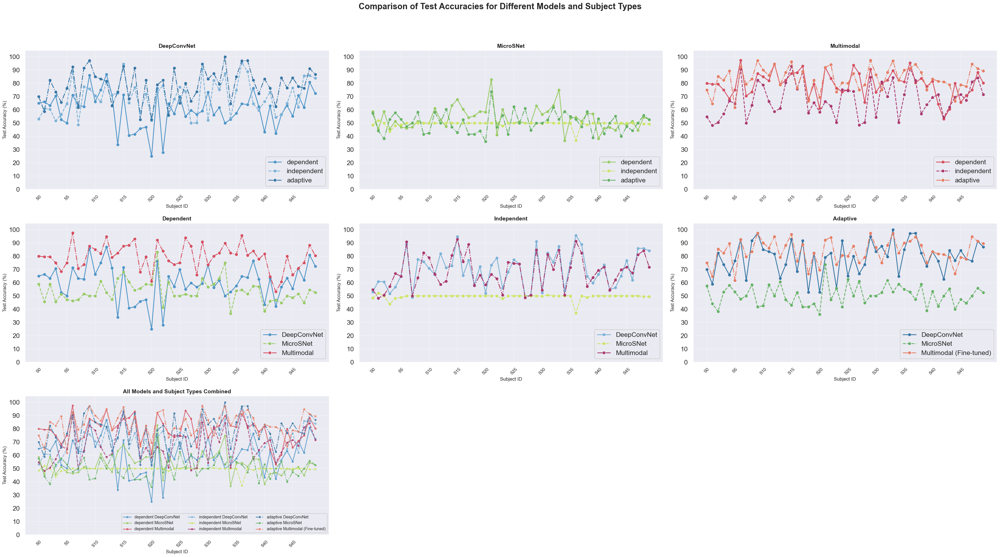


✅ ACCURACY line plots created successfully!


In [20]:
plot_model_performance(all_test_results, metric='accuracy', plot_type='line')

#### Violin plots

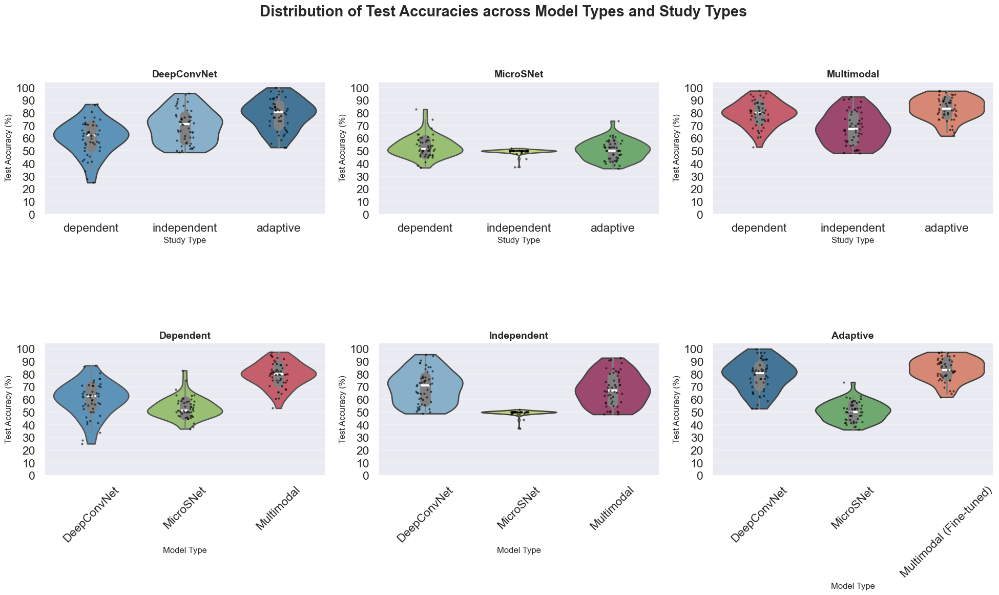


✅ ACCURACY violin plots created successfully!


In [21]:
plot_model_performance(all_test_results, metric='accuracy', plot_type='violin')

### F1 macro scores

In [22]:
print_summary(all_test_results, metric='f1_macro')


📊 Summary Statistics for F1_MACRO:

DEPENDENT:
  DeepConvNet: 57.49% ± 16.02%
    Min: 13.33%, Max: 86.25%
  MicroSNet: 49.94% ± 9.94%
    Min: 31.19%, Max: 82.04%
  Multimodal: 79.13% ± 9.88%
    Min: 51.18%, Max: 97.56%

INDEPENDENT:
  DeepConvNet: 69.37% ± 13.71%
    Min: 44.85%, Max: 95.61%
  MicroSNet: 23.01% ± 3.46%
    Min: 20.00%, Max: 44.17%
  Multimodal: 67.20% ± 13.22%
    Min: 43.40%, Max: 92.59%

ADAPTIVE:
  DeepConvNet: 78.28% ± 13.01%
    Min: 41.69%, Max: 100.00%
  MicroSNet: 28.02% ± 9.59%
    Min: 17.69%, Max: 60.51%
  Multimodal (Fine-tuned): 83.06% ± 9.39%
    Min: 60.95%, Max: 97.29%


#### Line plots

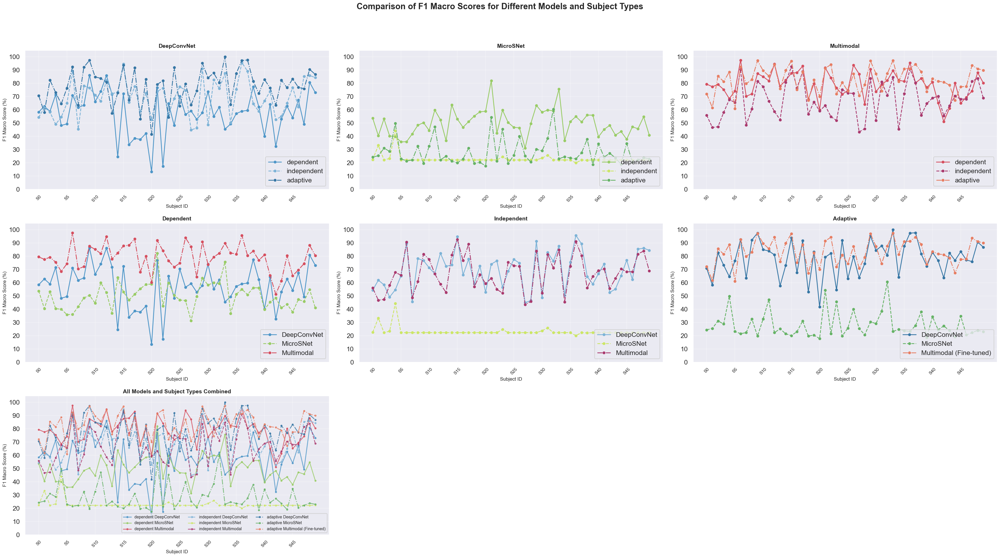


✅ F1_MACRO line plots created successfully!


In [23]:
plot_model_performance(all_test_results, metric='f1_macro', plot_type='line')

#### Violin plots

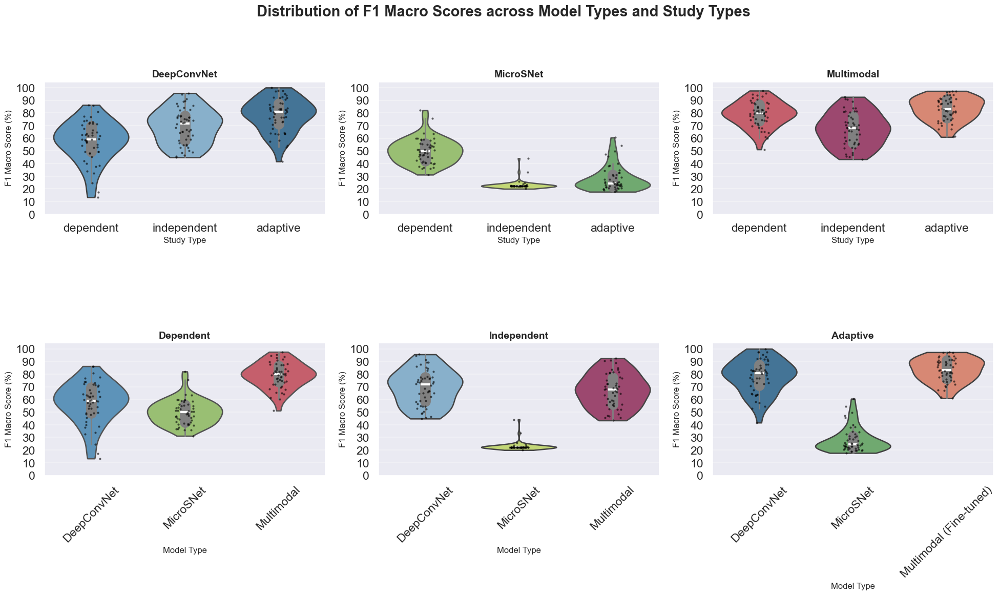


✅ F1_MACRO violin plots created successfully!


In [24]:
plot_model_performance(all_test_results, metric='f1_macro', plot_type='violin')

## Statistical significance of results 2

In [ ]:
stats_output_path = "../Output/ica_rest_all/results_all/statistical_analysis/"

### Accuracy

#### Model-wise

🎯 ACCURACY ANALYSIS: Comparing models within each subject type
STATISTICAL ANALYSIS OF MODEL TYPE COMPARISONS
Testing whether there are significant differences between model types
within each study type using repeated measures ANOVA.


STATISTICAL ANALYSIS FOR: DEPENDENT

STATISTICAL ANALYSIS FOR: INDEPENDENT

STATISTICAL ANALYSIS FOR: ADAPTIVE

1. DESCRIPTIVE STATISTICS:
----------------------------------------
                 count   mean    std    min    max
Comparison_Type                                   
MicroSNet           50  53.45   8.44  36.76  82.89
Multimodal          50  79.44   9.74  53.12  97.50
raw                 50  60.22  13.46  25.00  86.84

2. ASSUMPTION CHECKS:
----------------------------------------
Normality test (raw): W=0.9725, p=0.2927
Normality test (MicroSNet): W=0.9395, p=0.0129
Normality test (Multimodal): W=0.9799, p=0.5483
Levene's test (homogeneity): W=3.8789, p=0.0228

3. REPEATED MEASURES ANOVA:
----------------------------------------
           

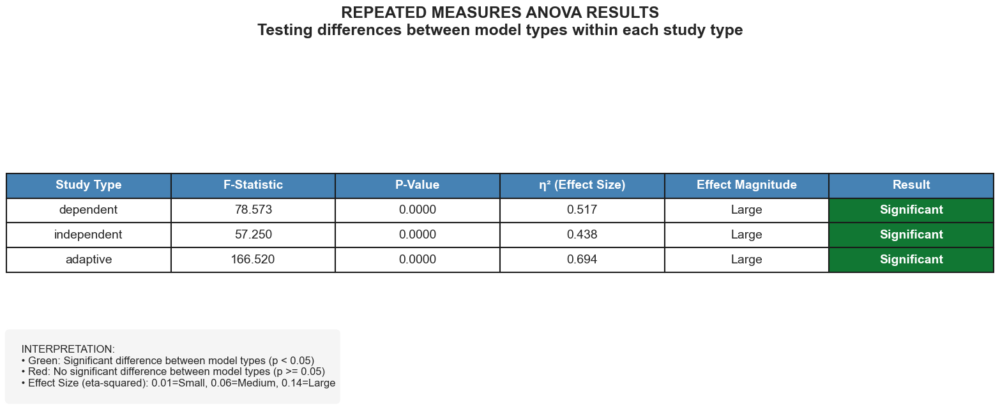

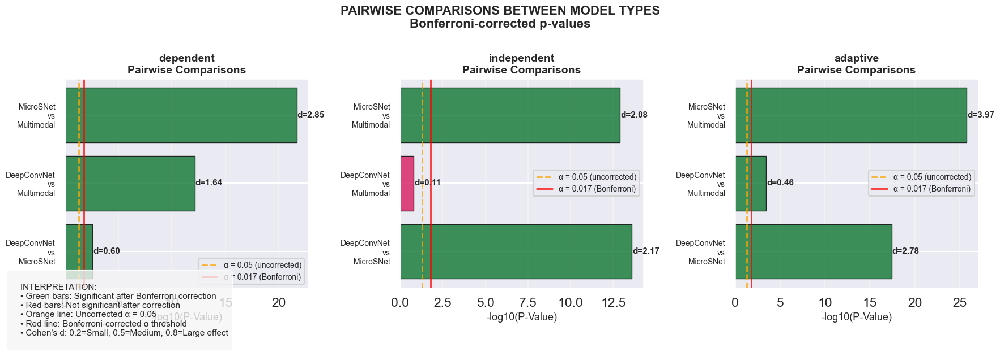

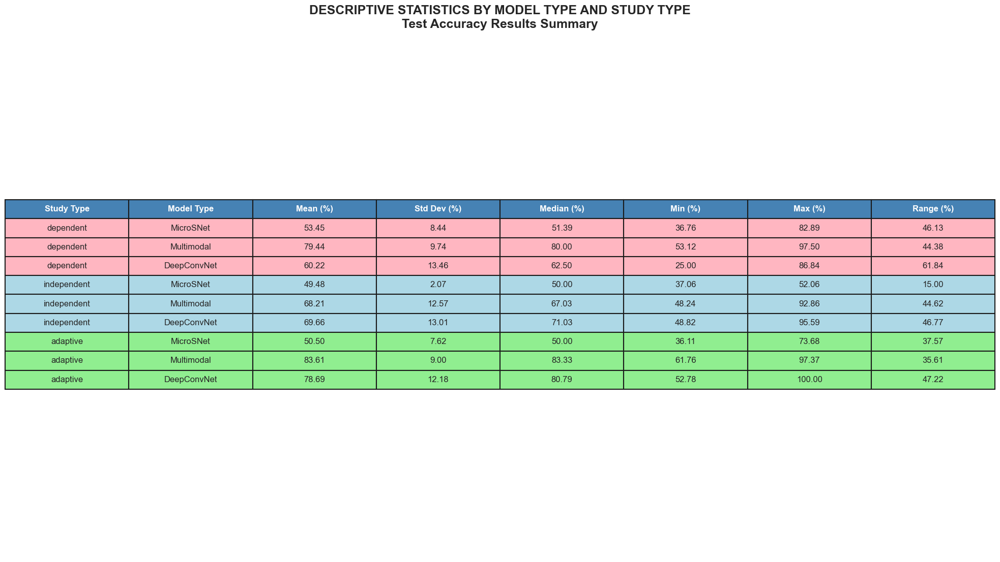


📊 QUICK SUMMARY:
----------------------------------------
dependent: p=0.0000 ✅ SIGNIFICANT (small effect)
independent: p=0.0000 ✅ SIGNIFICANT (small effect)
adaptive: p=0.0000 ✅ SIGNIFICANT (small effect)


In [44]:
acc_model_results = msf.analyze_accuracy_models(all_test_results, stats_output_path)
msf.print_quick_summary(acc_model_results)

#### Subject-wise

🎯 ACCURACY ANALYSIS: Comparing subject types within each model
📝 Note: Adaptive multimodal uses base scores for fair comparison
STATISTICAL ANALYSIS OF STUDY TYPE COMPARISONS
Testing whether there are significant differences between study types
within each model type using repeated measures ANOVA.


STATISTICAL ANALYSIS FOR: DEPENDENT

STATISTICAL ANALYSIS FOR: ADAPTIVE

STATISTICAL ANALYSIS FOR: INDEPENDENT

1. DESCRIPTIVE STATISTICS:
----------------------------------------
                 count   mean    std    min    max
Comparison_Type                                   
MicroSNet           50  53.45   8.44  36.76  82.89
Multimodal          50  79.44   9.74  53.12  97.50
raw                 50  60.22  13.46  25.00  86.84

2. ASSUMPTION CHECKS:
----------------------------------------
Normality test (raw): W=0.9725, p=0.2927
Normality test (MicroSNet): W=0.9395, p=0.0129
Normality test (Multimodal): W=0.9799, p=0.5483
Levene's test (homogeneity): W=3.8789, p=0.0228

3. REPEATED MEA

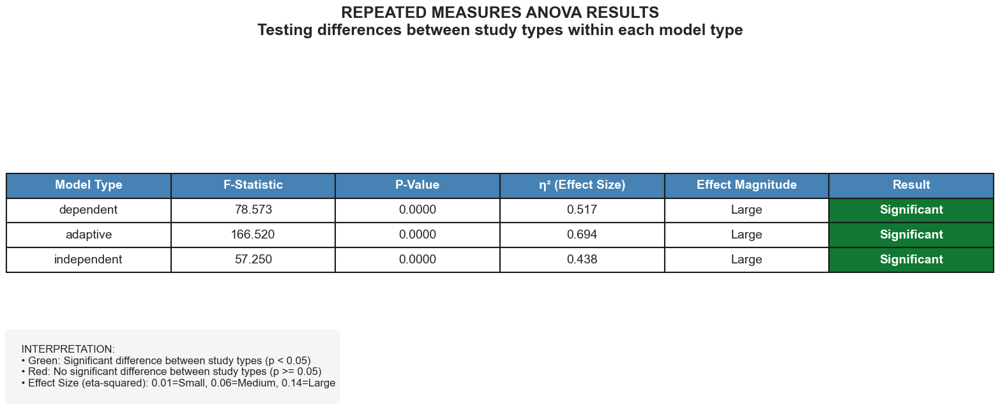

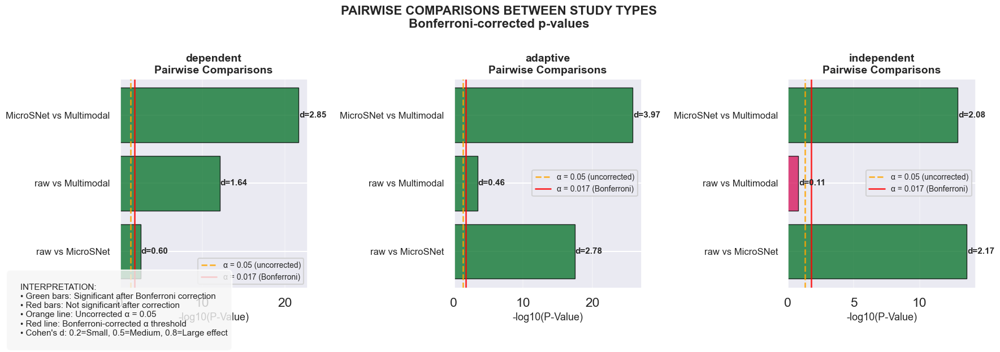

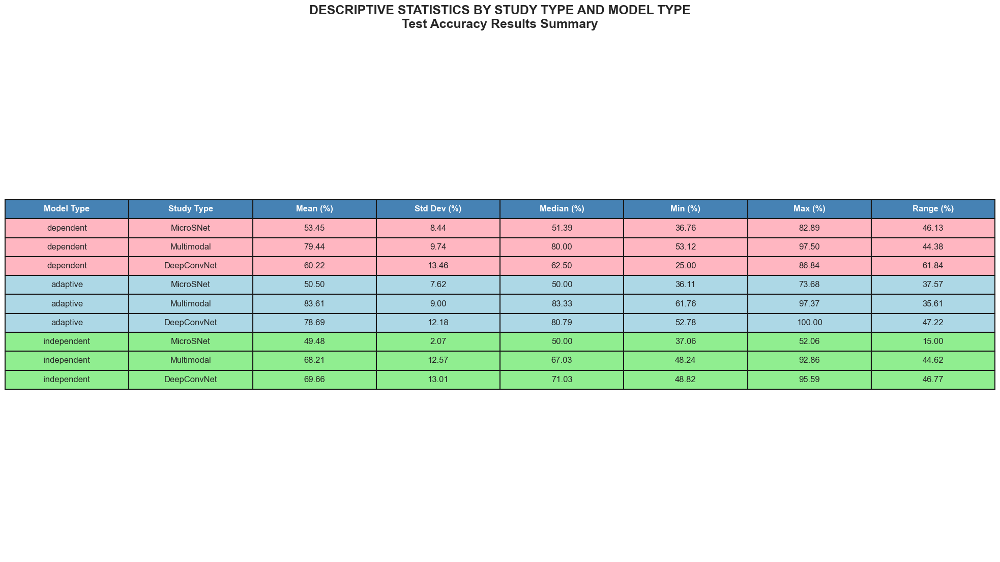


📊 QUICK SUMMARY:
----------------------------------------
dependent: p=0.0000 ✅ SIGNIFICANT (small effect)
adaptive: p=0.0000 ✅ SIGNIFICANT (small effect)
independent: p=0.0000 ✅ SIGNIFICANT (small effect)


In [45]:
acc_subject_results = msf.analyze_accuracy_subjects(all_test_results, stats_output_path)
msf.print_quick_summary(acc_subject_results)

### F1 macro scores

#### Model-wise

🎯 F1-MACRO ANALYSIS: Comparing models within each subject type
STATISTICAL ANALYSIS OF MODEL TYPE COMPARISONS
Testing whether there are significant differences between model types
within each study type using repeated measures ANOVA.


STATISTICAL ANALYSIS FOR: DEPENDENT

STATISTICAL ANALYSIS FOR: INDEPENDENT

STATISTICAL ANALYSIS FOR: ADAPTIVE

1. DESCRIPTIVE STATISTICS:
----------------------------------------
                 count   mean    std    min    max
Comparison_Type                                   
MicroSNet           50  49.94  10.04  31.19  82.04
Multimodal          50  79.13   9.98  51.18  97.56
raw                 50  57.49  16.18  13.33  86.25

2. ASSUMPTION CHECKS:
----------------------------------------
Normality test (raw): W=0.9632, p=0.1209
Normality test (MicroSNet): W=0.9578, p=0.0717
Normality test (Multimodal): W=0.9827, p=0.6687
Levene's test (homogeneity): W=5.1018, p=0.0072

3. REPEATED MEASURES ANOVA:
----------------------------------------
           

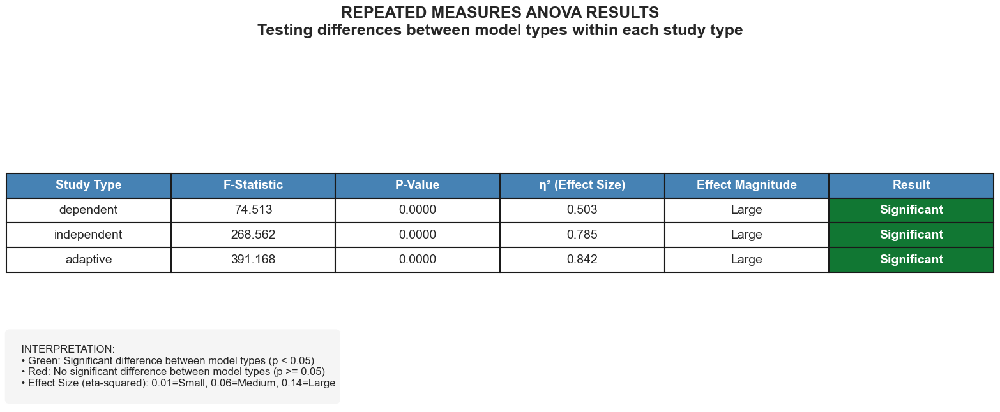

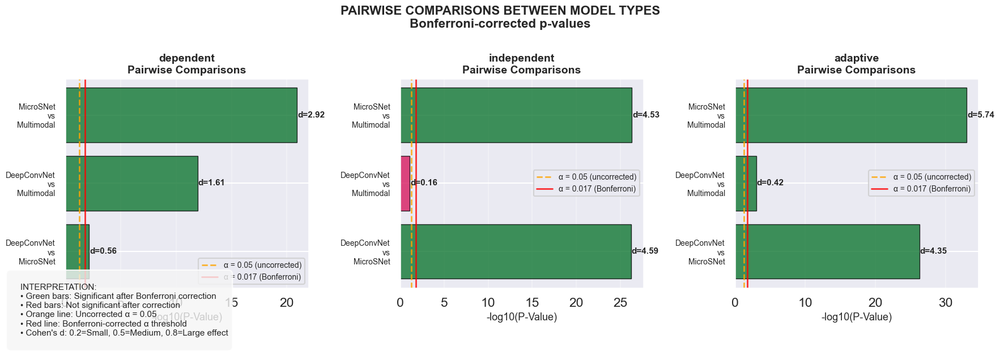

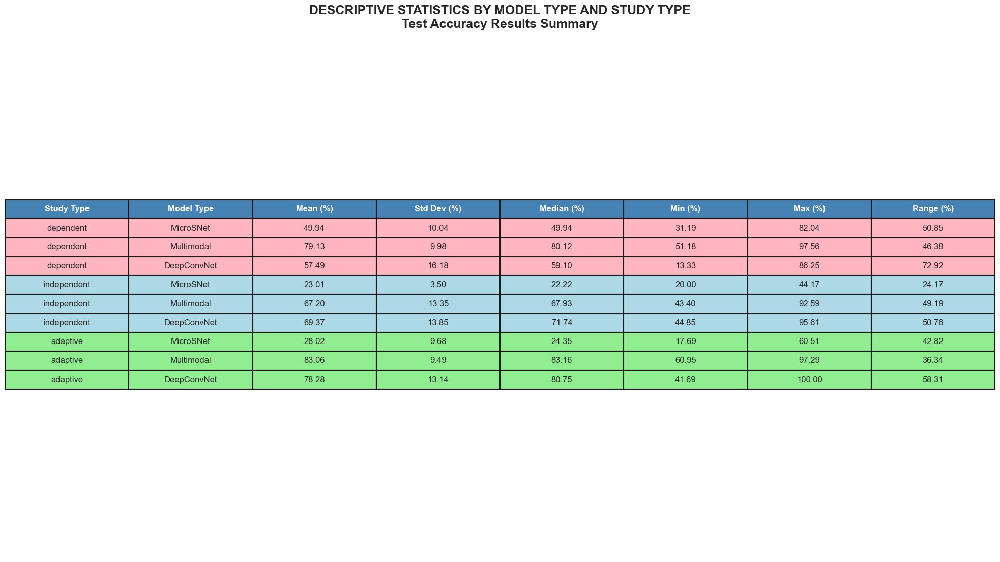


📊 QUICK SUMMARY:
----------------------------------------
dependent: p=0.0000 ✅ SIGNIFICANT (small effect)
independent: p=0.0000 ✅ SIGNIFICANT (small effect)
adaptive: p=0.0000 ✅ SIGNIFICANT (small effect)


In [46]:
f1_model_results = msf.analyze_f1_models(all_test_results, stats_output_path)
msf.print_quick_summary(f1_model_results)

#### Subject-wise

🎯 F1-MACRO ANALYSIS: Comparing subject types within each model
📝 Note: Adaptive multimodal uses base scores for fair comparison
STATISTICAL ANALYSIS OF STUDY TYPE COMPARISONS
Testing whether there are significant differences between study types
within each model type using repeated measures ANOVA.


STATISTICAL ANALYSIS FOR: DEPENDENT

STATISTICAL ANALYSIS FOR: ADAPTIVE

STATISTICAL ANALYSIS FOR: INDEPENDENT

1. DESCRIPTIVE STATISTICS:
----------------------------------------
                 count   mean    std    min    max
Comparison_Type                                   
MicroSNet           50  49.94  10.04  31.19  82.04
Multimodal          50  79.13   9.98  51.18  97.56
raw                 50  57.49  16.18  13.33  86.25

2. ASSUMPTION CHECKS:
----------------------------------------
Normality test (raw): W=0.9632, p=0.1209
Normality test (MicroSNet): W=0.9578, p=0.0717
Normality test (Multimodal): W=0.9827, p=0.6687
Levene's test (homogeneity): W=5.1018, p=0.0072

3. REPEATED MEA

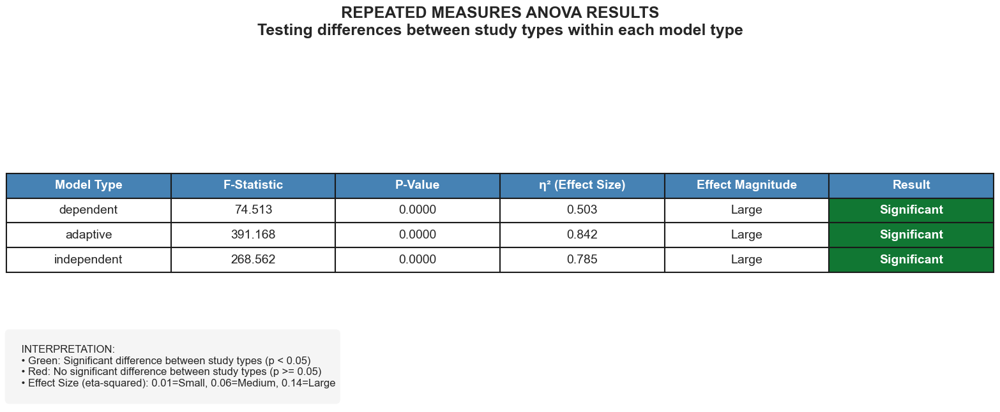

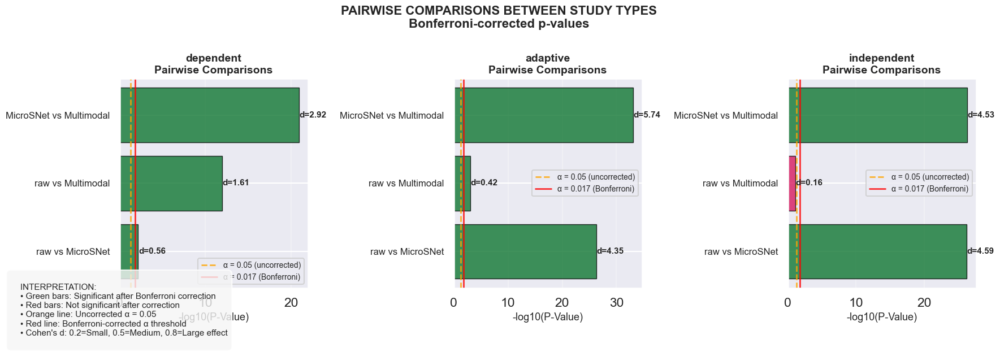

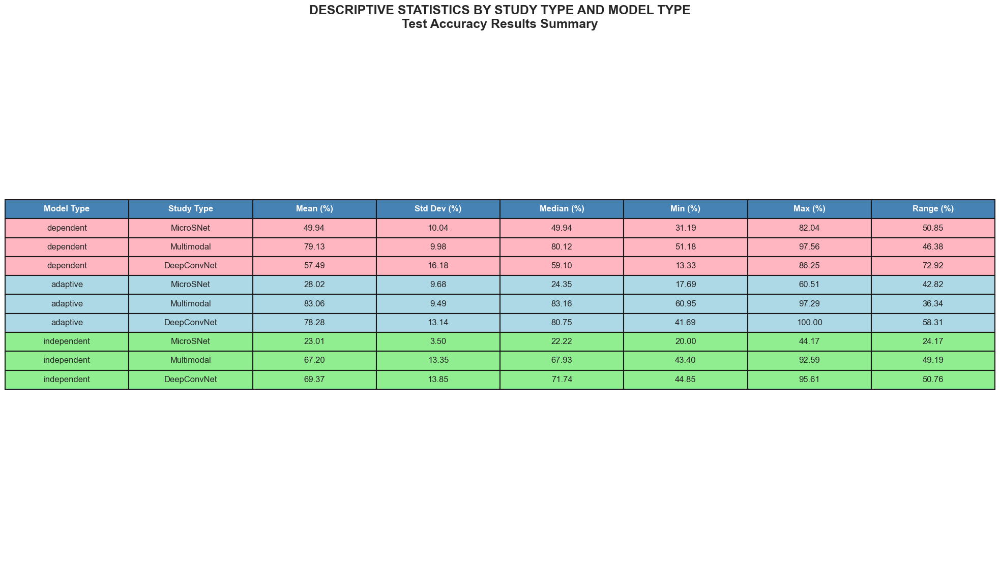


📊 QUICK SUMMARY:
----------------------------------------
dependent: p=0.0000 ✅ SIGNIFICANT (small effect)
adaptive: p=0.0000 ✅ SIGNIFICANT (small effect)
independent: p=0.0000 ✅ SIGNIFICANT (small effect)


In [47]:
f1_subject_results = msf.analyze_f1_subjects(all_test_results, stats_output_path)
msf.print_quick_summary(f1_subject_results)